In [5]:
import cv2
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# ----------------------------------------------------------------------
## 🚀 Exécution pour les images fournies
# ----------------------------------------------------------------------

import os

def process_all_images(folder_path: str = "images/"):
    """
    Parcourt le dossier, exécute la détection sur chaque image, 
    et affiche les résultats dans des fenêtres OpenCV.
    """
    if not os.path.exists(folder_path):
        print(f"Erreur: Le dossier '{folder_path}' n'existe pas. Veuillez le créer et y placer vos images.")
        return

    image_extensions = ('.jpg', '.jpeg', '.png', '.webp')
    images_trouvees = [f for f in os.listdir(folder_path) if f.lower().endswith(image_extensions)]

    if not images_trouvees:
        print(f"Aucune image trouvée dans le dossier '{folder_path}'.")
        return

    print(f"--- Démarrage du test de robustesse sur {len(images_trouvees)} images ---")

    for i, file_name in enumerate(images_trouvees):
        full_path = os.path.join(folder_path, file_name)
        
        # Exécuter la détection
        result_img, norm_coords = detect_and_draw_largest_triangle_face_with_steps(full_path)
        
        # Affichage du résultat de la détection
        if result_img is not None:
            cv2.imshow(f"Detection Result ({i+1}/{len(images_trouvees)}): {file_name}", result_img)
        
        # Affichage des coordonnées détectées
        if norm_coords:
            print(f"✅ Coordonnées {file_name} : {norm_coords}")
        else:
            print(f"❌ ÉCHEC de détection sur {file_name}. (Score trop bas ou aucun triangle régulier trouvé)")

    # Attendre une touche et fermer les fenêtres après le traitement de toutes les images
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    print("--- Test terminé. ---")




# Wrap cv2.imshow to accept PIL.Image by converting to BGR numpy array,
# then call the original process_all_images. Restore cv2.imshow afterwards.
_original_imshow = cv2.imshow

def _imshow_wrapper(winname, img):
    # If it's a PIL Image, convert to BGR numpy for OpenCV
    if isinstance(img, Image.Image):
        arr = np.array(img)
        if arr.ndim == 3 and arr.shape[2] == 3:
            arr = cv2.cvtColor(arr, cv2.COLOR_RGB2BGR)
        _original_imshow(winname, arr)
    else:
        _original_imshow(winname, img)

cv2.imshow = _imshow_wrapper



In [ ]:
def detect_and_draw_largest_triangle_face_with_steps(image_path: str):
    """
    Détecte la plus grande face triangulaire du Pyraminx et affiche 
    l'image après chaque étape de traitement, y compris l'Enveloppe Convexe.
    """
    # 1. Chargement de l'image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Erreur: Impossible de charger l'image à {image_path}")
        return None, None

    # Version RGB pour l'affichage
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img_pil = Image.fromarray(img_rgb)
    
    # Préparez la figure pour l'affichage des étapes
    fig, axes = plt.subplots(1, 6, figsize=(24, 5))
    fig.suptitle(f"Étapes de Traitement pour: {image_path}", fontsize=14)
    
    # -----------------------------------------------------------
    # ÉTAPES 1 à 4: Pré-traitement et Isolation des Contours
    # -----------------------------------------------------------
    
    # Étape 1: Niveaux de Gris
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0].imshow(gray, cmap='gray'); axes[0].set_title('1. Niveaux de Gris'); axes[0].axis('off')
    
    # Étape 2: Flou Gaussien (Fusion des détails internes)
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    axes[1].imshow(blurred, cmap='gray'); axes[1].set_title('2. Flou Gaussien'); axes[1].axis('off')
    
    # Étape 3: Détection d'Arêtes Canny
    edges = cv2.Canny(blurred, 20, 50) 
    axes[2].imshow(edges, cmap='gray'); axes[2].set_title('3. Arêtes Canny'); axes[2].axis('off')
    
    # Étape 4: Dilatation (Renforcement du Contour)
    kernel = np.ones((5,5),np.uint8)
    edges_dilated = cv2.dilate(edges, kernel, iterations = 1)
    axes[3].imshow(edges_dilated, cmap='gray'); axes[3].set_title('4. Dilatation'); axes[3].axis('off')

    # -----------------------------------------------------------
    # ÉTAPE 5: Enveloppe Convexe (Stabilisation de la Forme)
    # -----------------------------------------------------------

    # Trouver les contours externes
    contours, _ = cv2.findContours(edges_dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    largest_triangle_contour = None
    max_area = 0
    normalized_coords = None

    if not contours:
        print(f"Aucun contour détecté pour {image_path}")
        return original_img_pil, None
    
    # Sélectionner le plus grand contour (celui du Pyraminx)
    largest_contour = max(contours, key=cv2.contourArea)
    
    # Calculer l'enveloppe convexe pour lisser le contour et obtenir les points externes
    hull = cv2.convexHull(largest_contour)
    
    # Dessiner l'enveloppe convexe pour l'affichage
    hull_img = np.zeros_like(img_rgb)
    cv2.drawContours(hull_img, [hull], 0, (0, 255, 0), 2)
    axes[4].imshow(hull_img); axes[4].set_title('5. Enveloppe Convexe'); axes[4].axis('off')

    # -----------------------------------------------------------
    # ÉTAPE 6: Approximation de Sommets et Tracé Final
    # -----------------------------------------------------------
    
    # Approximation polygonale sur l'enveloppe convexe pour forcer 3 sommets
    epsilon = 0.05 * cv2.arcLength(hull, True)
    approx = cv2.approxPolyDP(hull, epsilon, True)
    
    if len(approx) == 3:
        largest_triangle_contour = approx
        # L'aire est déjà celle du plus grand contour, pas besoin de max_area ici
    
    # Tracé
    draw_img_pil = original_img_pil.copy()
    draw = ImageDraw.Draw(draw_img_pil)

    if largest_triangle_contour is not None:
        points = [tuple(point[0]) for point in largest_triangle_contour]
        
        # Tracer les contours en rouge (épaisseur 10)
        for i in range(3):
            draw.line([points[i], points[(i + 1) % 3]], fill="red", width=10)

        # Calculer les coordonnées normalisées (0-1000)
        width, height = draw_img_pil.size
        normalized_coords = [
            (int(p[0] / width * 1000), int(p[1] / height * 1000)) for p in points
        ]
        
    axes[5].imshow(draw_img_pil); axes[5].set_title('6. Résultat Final'); axes[5].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return draw_img_pil, normalized_coords

Erreur: Impossible de charger l'image à im.jpg

Coordonnées Normalisées (Vue Frontale) : None
Erreur: Impossible de charger l'image à Pyraminx.jpg

Coordonnées Normalisées (Vue Perspective) : None
Erreur: Impossible de charger l'image à images.jpg


(None, None)


DÉTECTION PYRAMINX – Démarrage du traitement des images (Affichage par ligne)...

→ Traitement de l'image 1/10 : B.jpg


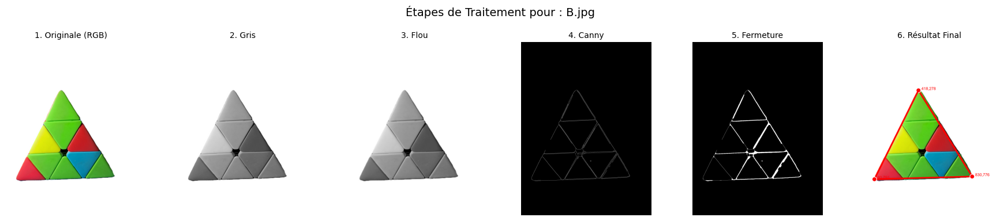


→ Traitement de l'image 2/10 : B2.jpg


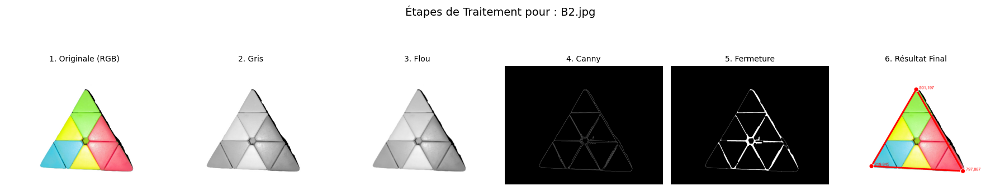


→ Traitement de l'image 3/10 : F.jpg


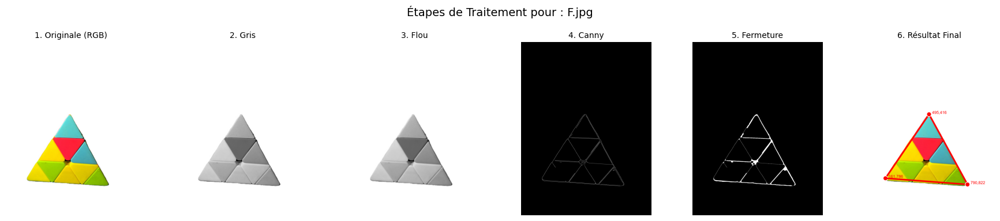


→ Traitement de l'image 4/10 : F2.jpg


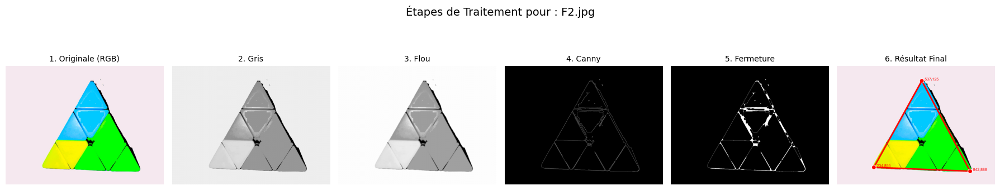


→ Traitement de l'image 5/10 : L.jpg


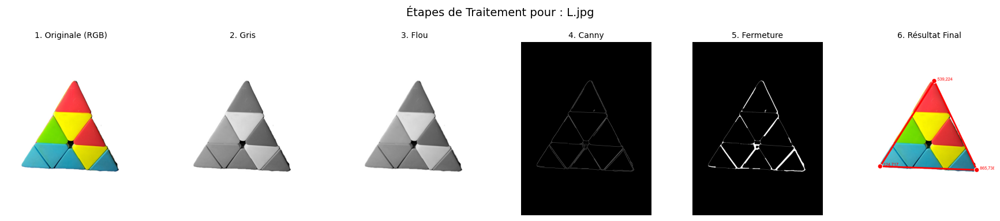


→ Traitement de l'image 6/10 : L2.jpg


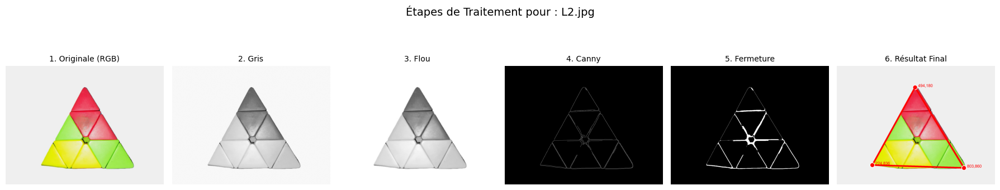


→ Traitement de l'image 7/10 : R.jpg


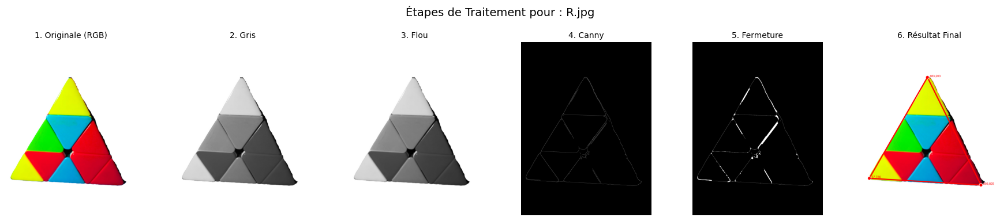


→ Traitement de l'image 8/10 : R2.jpg


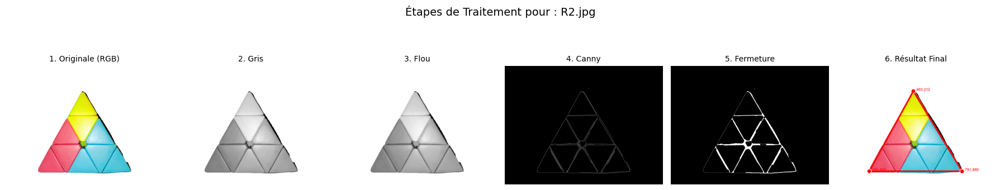


→ Traitement de l'image 9/10 : images - Copie.jpg


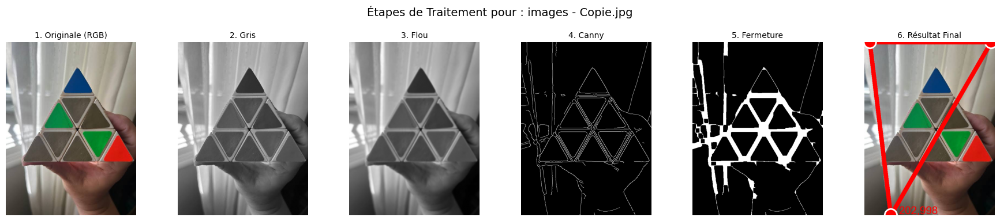


→ Traitement de l'image 10/10 : images.jpg


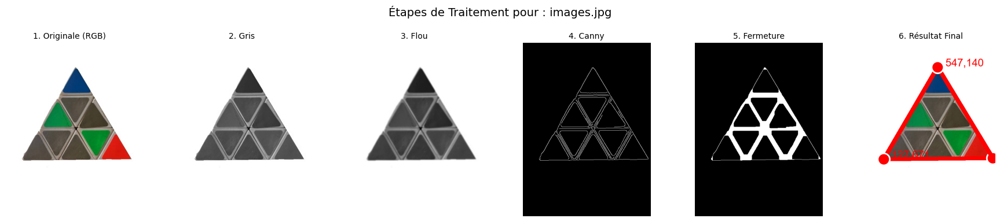


RÉSULTATS FINAUX (Coordonnées Normalisées 1000x1000)
B.jpg                               → Principale : [(418, 278), (830, 776), (80, 791)]
B2.jpg                              → Principale : [(501, 197), (797, 887), (219, 845)]
F.jpg                               → Principale : [(161, 786), (495, 416), (790, 822)]
F2.jpg                              → Principale : [(537, 125), (842, 888), (234, 855)]
L.jpg                               → Principale : [(539, 224), (865, 738), (124, 717)]
L2.jpg                              → Principale : [(494, 180), (803, 860), (224, 836)]
R.jpg                               → Principale : [(483, 203), (893, 825), (37, 786)]
R2.jpg                              → Principale : [(483, 212), (791, 889), (205, 888)]
images - Copie.jpg                  → Principale : [(970, 0), (202, 998), (41, 0)]
images.jpg                          → Principale : [(979, 665), (127, 671), (547, 140)]


In [13]:
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import os

# Deux dictionnaires séparés
PRIMARY_FACES   = {}   # Face principale (la plus grande) → toujours rouge
SECONDARY_FACES = {}   # Deuxième face visible → bleue (ou None)

# Chemin d'accès à la police
FONT_PATH = "arial.ttf" 

# ────────────────────── Logique de Détection ──────────────────────

def get_pyraminx_triangle(approx):
    """
    Extrait un triangle (3 points) d'un contour polygonal (3 ou 4 points).
    Logique basée sur les points extrêmes pour le cas à 4 points (trapèze).
    """
    if len(approx) == 3:
        return approx.copy()

    if len(approx) == 4:
        pts = approx.reshape(4, 2)

        # Points extrêmes (votre logique d'origine)
        leftmost  = min(pts, key=lambda p: p[0])
        rightmost = max(pts, key=lambda p: p[0])
        topmost   = min(pts, key=lambda p: p[1])
        bottommost= max(pts, key=lambda p: p[1])

        candidates = [topmost, bottommost, leftmost, rightmost]
        unique = []
        for p in candidates:
            if not any(np.allclose(p, e) for e in unique):
                unique.append(p)

        # On prend les 3 premiers points uniques trouvés
        if len(unique) >= 3:
            triangle = np.array(unique[:3], dtype=np.int32).reshape(-1, 1, 2)
            return triangle
        
    # Autres cas → forcer 3 points
    epsilon = 0.04 * cv2.arcLength(approx, True) # Réduction de epsilon pour être plus strict
    approx2 = cv2.approxPolyDP(approx, epsilon, True)
    if len(approx2) >= 3:
        return approx2[:3]
        
    return None


def detect_pyraminx_faces(image_path: str):
    """
    Détecte les faces principale et secondaire.
    Retourne (image_resultat_pil, [etapes_numpy]).
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Erreur: Impossible de charger {image_path}")
        return None, []

    h, w = img.shape[:2]

    # ──────── Pré-traitement et collection des étapes ────────
    steps = []
    
    # Étape 0: Originale (BGR convertie en RGB pour l'affichage)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    steps.append(img_rgb.copy())
    
    # Étape 1: Niveaux de Gris
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    steps.append(gray)
    
    # Étape 2: Flou Gaussien
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)
    steps.append(blurred)
    
    # Étape 3: Canny
    edges = cv2.Canny(blurred, 10, 60)
    steps.append(edges)
    
    # Étape 4: Fermeture Morphologique
    kernel = np.ones((7,7), np.uint8)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=2)
    steps.append(closed)
    
    # ──────── Détection des contours et faces ────────
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    original_img_pil = Image.fromarray(img_rgb)
    draw_img = original_img_pil.copy()
    draw = ImageDraw.Draw(draw_img)
    
    try:
        font = ImageFont.truetype(FONT_PATH, 40)
    except Exception:
        font = ImageFont.load_default()

    candidates = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < (h*w)*0.04 or area > (h*w)*0.95: 
            continue
        hull = cv2.convexHull(cnt)
        epsilon = 0.04 * cv2.arcLength(hull, True)
        approx = cv2.approxPolyDP(hull, epsilon, True)
        tri = get_pyraminx_triangle(approx)
        if tri is not None:
            candidates.append((cv2.contourArea(tri), tri))

    if not candidates:
        steps.append(img_rgb) # Ajout de l'image RGB non modifiée pour le résultat
        return draw_img, steps

    candidates.sort(key=lambda x: x[0], reverse=True)

    # ──────── Face principale (rouge) ────────
    _, primary_tri = candidates[0]
    primary_pts = [tuple(p[0]) for p in primary_tri]
    norm_primary = [(int(x/w*1000), int(y/h*1000)) for x, y in primary_pts]

    for i in range(3):
        draw.line([primary_pts[i], primary_pts[(i+1)%3]], fill="red", width=16)
        x, y = primary_pts[i]
        draw.ellipse([x-25, y-25, x+25, y+25], fill="red", outline="white", width=6)
        text_x, text_y = norm_primary[i]
        draw.text((x+30, y-40), f"{text_x},{text_y}", fill="red", font=font)

    filename = os.path.basename(image_path)
    PRIMARY_FACES[filename] = {"normalized": norm_primary, "pixels": primary_pts}

    # ──────── Deuxième face (bleue) ────────
    secondary_norm = None
    if len(candidates) > 1:
        area1, _ = candidates[0]
        area2, secondary_tri = candidates[1]
        
        if area2 > area1 * 0.20:
            sec_pts = [tuple(p[0]) for p in secondary_tri]
            secondary_norm = [(int(x/w*1000), int(y/h*1000)) for x, y in sec_pts]

            for i in range(3):
                draw.line([sec_pts[i], sec_pts[(i+1)%3]], fill="blue", width=12)
            
            for i, (x, y) in enumerate(sec_pts):
                draw.ellipse([x-20, y-20, x+20, y+20], fill="blue", outline="white", width=5)
                text_x, text_y = secondary_norm[i]
                draw.text((x+25, y+30), f"{text_x},{text_y}", fill="cyan", font=font)

            SECONDARY_FACES[filename] = {"normalized": secondary_norm, "pixels": sec_pts}
            print(f"{filename} → 2 faces détectées")
        else:
            SECONDARY_FACES[filename] = None
    else:
        SECONDARY_FACES[filename] = None

    # Étape 5: Résultat Final (image PIL convertie en numpy array RGB)
    steps.append(np.array(draw_img))
    
    return draw_img, steps

# ────────────────────── Logique d'Affichage ──────────────────────

def display_steps_in_subplot(filename, steps):
    """Affiche toutes les étapes pour une seule image dans une figure."""
    
    titles = ["1. Originale (RGB)", "2. Gris", "3. Flou", "4. Canny", "5. Fermeture", "6. Résultat Final"]
    num_steps = len(steps) # Doit être 6

    if num_steps != 6:
        print(f"Erreur d'étapes pour {filename}. Affichage ignoré.")
        return

    plt.figure(figsize=(18, 4)) # Figure plus large que haute
    plt.suptitle(f"Étapes de Traitement pour : {filename}", fontsize=14)

    for j in range(num_steps):
        ax = plt.subplot(1, num_steps, j + 1)
        img = steps[j]
        
        ax.set_title(titles[j], fontsize=10)
        ax.axis('off')

        if img.ndim == 2: # Images monochromes (Gray, Canny, Closed)
            ax.imshow(img, cmap='gray')
        else: # Images couleurs (Original, Résultat)
            ax.imshow(img)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajuster pour le suptitle
    plt.show()

# ────────────────────── Traitement du dossier ──────────────────────

def process_all_images(folder_path="images/"):
    """Traite toutes les images et affiche leurs étapes."""
    
    if not os.path.exists(folder_path):
        print(f"Erreur: Dossier non trouvé : {folder_path}. Simulation de deux images pour l'illustration.")
        simulate_multiple_pyraminx_steps()
        return

    print("\n" + "="*90)
    print("DÉTECTION PYRAMINX – Démarrage du traitement des images (Affichage par ligne)...")
    print("="*90)
    
    files = sorted(os.listdir(folder_path))
    image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))]

    if not image_files:
        print(f"Aucune image trouvée dans le dossier : {folder_path}")
        return

    for i, file in enumerate(image_files):
        full_path = os.path.join(folder_path, file)
        print(f"\n→ Traitement de l'image {i+1}/{len(image_files)} : {file}")
        
        # Le résultat PIL n'est pas utilisé directement ici
        _, steps = detect_pyraminx_faces(full_path)
        
        if steps and len(steps) == 6:
            display_steps_in_subplot(file, steps)
        elif steps:
            print(f"Avertissement: Nombre d'étapes incorrect ({len(steps)}) pour {file}.")

    # ──────── Résumé final ────────
    print("\n" + "="*90)
    print("RÉSULTATS FINAUX (Coordonnées Normalisées 1000x1000)")
    print("="*90)
    for name in PRIMARY_FACES:
        p = PRIMARY_FACES[name]["normalized"]
        s_data = SECONDARY_FACES.get(name)
        s_str = f" | Secondaire : {s_data['normalized']}" if s_data else ""
        print(f"{name:35} → Principale : {p}{s_str}")
    print("="*90)

# ────────────────────── Fonction de Simulation ──────────────────────

def simulate_multiple_pyraminx_steps():
    """Crée et traite deux images simulées pour montrer la fonctionnalité subplot."""
    
    # Simulation de deux images
    
    # Image 1: Une seule grande face
    img1 = np.zeros((200, 200, 3), dtype=np.uint8) + 255
    pts1 = np.array([[(50, 150)], [(150, 150)], [(100, 50)]], dtype=np.int32)
    cv2.fillConvexPoly(img1, pts1, (255, 100, 0)) # Orange
    
    # Image 2: Deux faces avec contour plus flou
    img2 = np.zeros((200, 250, 3), dtype=np.uint8) + 255
    pts_A = np.array([[(40, 180)], [(140, 180)], [(90, 80)]], dtype=np.int32)
    pts_B = np.array([[(140, 180)], [(220, 150)], [(160, 50)]], dtype=np.int32)
    cv2.fillConvexPoly(img2, pts_A, (0, 0, 150)) # Bleu
    cv2.fillConvexPoly(img2, pts_B, (0, 150, 0)) # Vert
    # Ajout d'un peu de bruit pour simuler des bords moins nets
    img2 = cv2.GaussianBlur(img2, (5, 5), 0)
    
    temp_path1 = "sim_A.png"
    temp_path2 = "sim_B.png"
    cv2.imwrite(temp_path1, img1)
    cv2.imwrite(temp_path2, img2)
    
    print("\nSimulation du traitement pour deux fichiers : sim_A.png et sim_B.png.")
    
    # Traitement de la première image
    _, steps_A = detect_pyraminx_faces(temp_path1)
    display_steps_in_subplot("sim_A.png", steps_A)
    
    # Traitement de la deuxième image
    _, steps_B = detect_pyraminx_faces(temp_path2)
    display_steps_in_subplot("sim_B.png", steps_B)
    
    # Nettoyage
    os.remove(temp_path1)
    os.remove(temp_path2)
    
    # Résumé des résultats simulés
    print("\n" + "="*90)
    print("RÉSULTATS FINAUX SIMULÉS")
    print("="*90)
    for name in PRIMARY_FACES:
        p = PRIMARY_FACES[name]["normalized"]
        s_data = SECONDARY_FACES.get(name)
        s_str = f" | Secondaire : {s_data['normalized']}" if s_data else ""
        print(f"{name:35} → Principale : {p}{s_str}")
    print("="*90)
    
# Lancement de la fonction principale (elle appellera la simulation si 'images/' n'est pas trouvé)
process_all_images("images/")


 PYRAMINX SCANNER ULTIME — RÈGLE PHYSIQUE PARFAITE + BUG FIXÉ

Traitement → 20effb824fd5aeda292e779334fb.jpeg


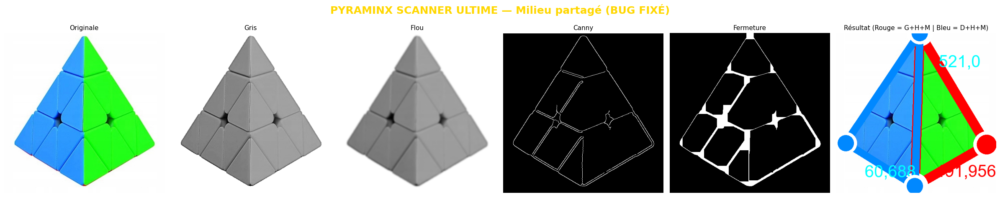


Traitement → 417-4176378_pyraminx.png


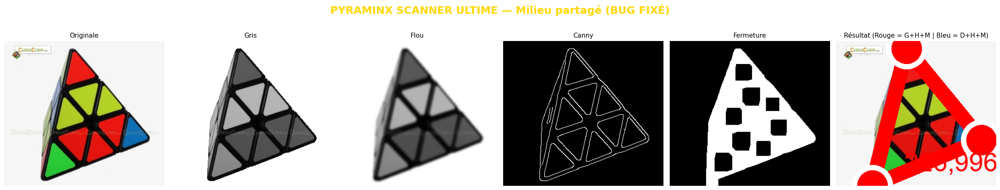


Traitement → 41DClHShCwL._AC_.jpg


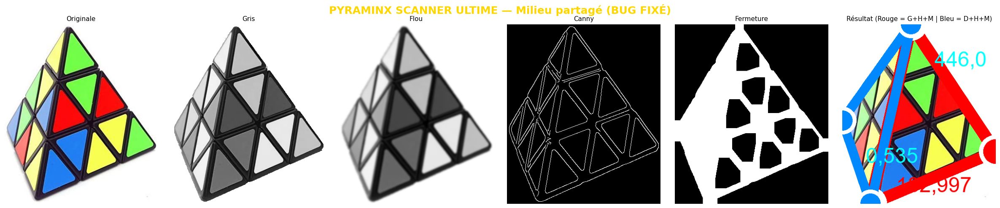


Traitement → Kostka-Rubika-Piramida-6.webp


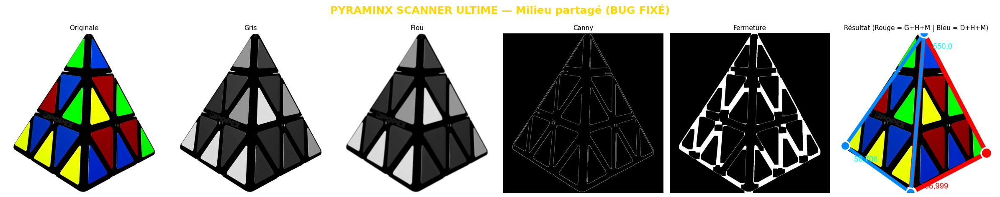


Traitement → MoYu-Pyraminx-Black-3.jpg


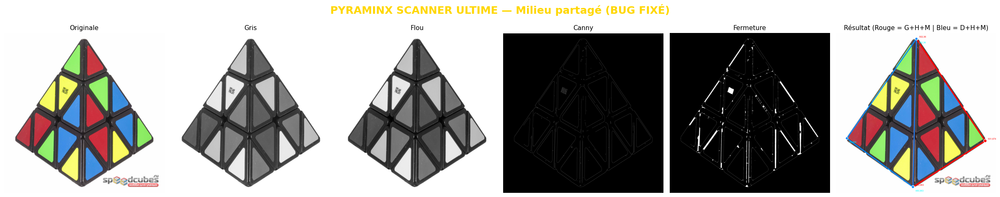


Traitement → OIP (1).webp


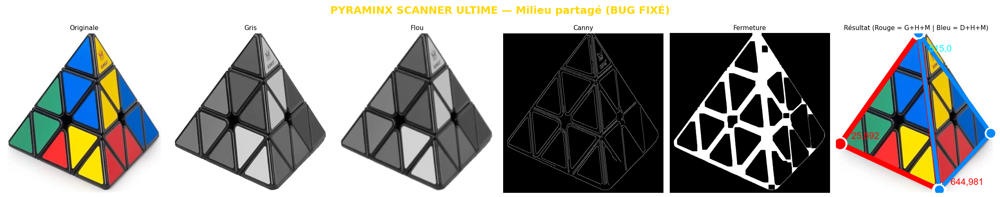


Traitement → OIP (2).webp


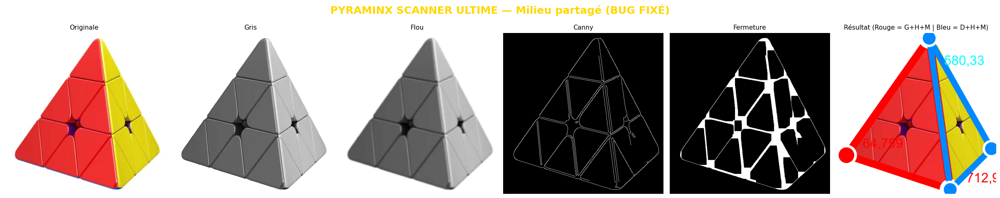


Traitement → OIP.webp


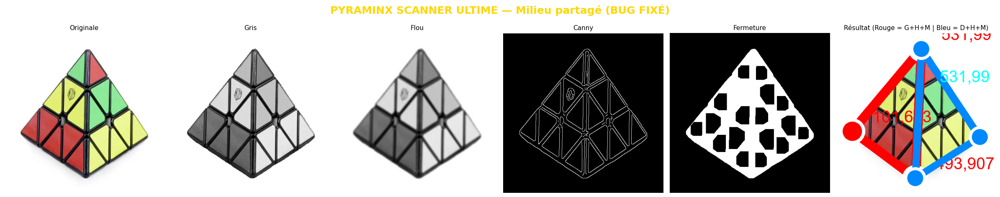


Traitement → Pyraminx.jpg
PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.000000e-04
    shift = 0.000000e+00
Try decreasing discard_threshold or start with a larger shift

PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.000000e-04
    shift = 1.000000e-04
Try decreasing discard_threshold or start with a larger shift



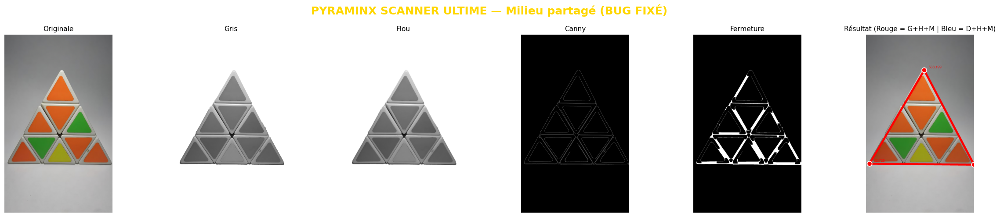


Traitement → im.jpg


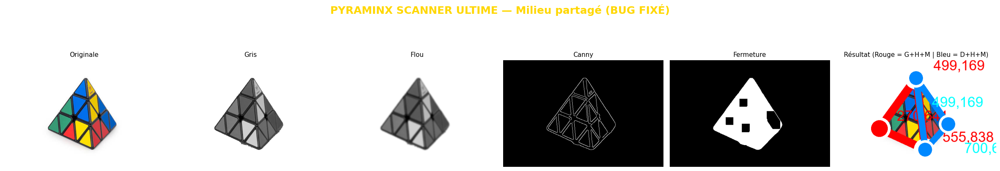


Traitement → images.jpg


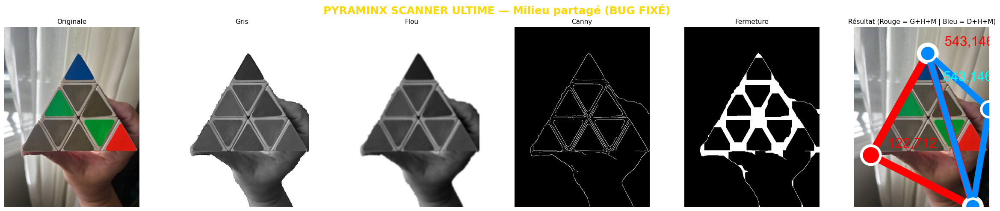


Traitement → mgcpyraminx.webp


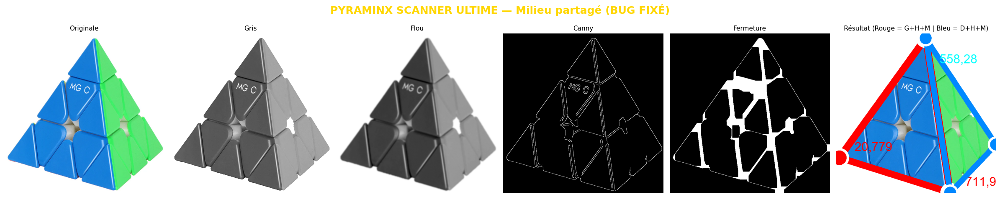


Traitement → paso-1-768x768.jpg


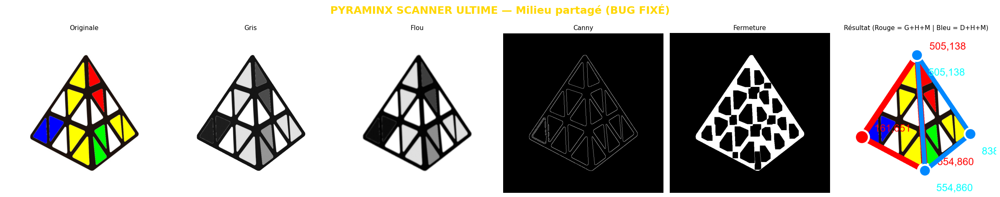


Traitement → pyraminx_3x3x3_mgc_evo_magnetico_color_87518261_1_49ecd0c07c1729fa3910ad4c85d131c5.webp


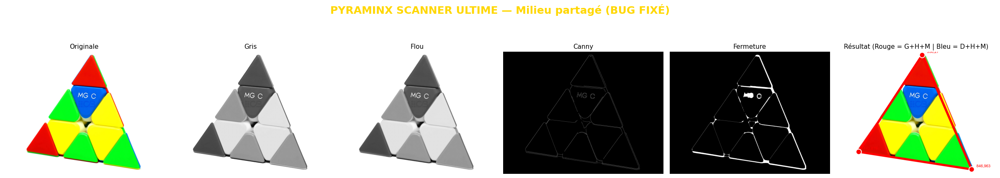


Traitement → pyraminx_face_frontal_contour_final.png


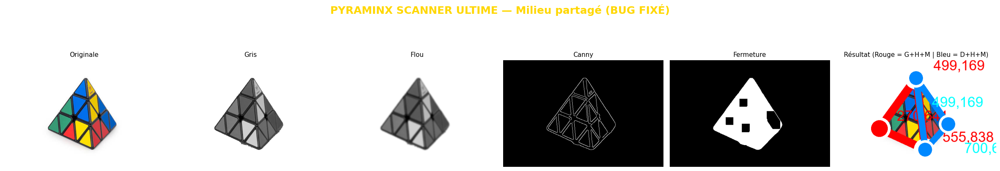


Traitement → recent_pyraminx_M5035_02.jpg


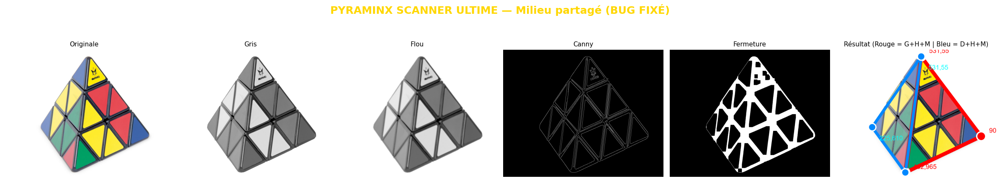


RÉSULTATS FINAUX
20effb824fd5aeda292e779334fb.jpeg        → Principale: [(939, 696), (521, 0), (491, 956)] | Secondaire: [(60, 688), (521, 0), (491, 956)]
417-4176378_pyraminx.png                 → Principale: [(440, 51), (906, 682), (226, 996)]
41DClHShCwL._AC_.jpg                     → Principale: [(997, 708), (446, 0), (182, 997)] | Secondaire: [(0, 535), (446, 0), (182, 997)]
Kostka-Rubika-Piramida-6.webp            → Principale: [(939, 751), (550, 0), (466, 999)] | Secondaire: [(58, 706), (550, 0), (466, 999)]
MoYu-Pyraminx-Black-3.jpg                → Principale: [(931, 674), (502, 36), (480, 963)] | Secondaire: [(68, 658), (502, 36), (480, 963)]
OIP (1).webp                             → Principale: [(25, 692), (515, 0), (644, 981)] | Secondaire: [(965, 627), (515, 0), (644, 981)]
OIP (2).webp                             → Principale: [(64, 759), (580, 33), (712, 972)] | Secondaire: [(969, 719), (580, 33), (712, 972)]
OIP.webp                                 → Principale: [(101

In [63]:
# =====================================================
# PYRAMINX SCANNER ULTIME — RÈGLE PHYSIQUE PARFAITE (CORRIGÉE)
# "Face gauche = gauche + haut + milieu" | "Face droite = droite + haut + milieu"
# BUG FIXÉ + ANTI-DOUBLON SOLIDE
# =====================================================

import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import os
from rembg import remove

PRIMARY_FACES   = {}
SECONDARY_FACES = {}

def points_are_similar(pt1, pt2, tol=40):
    """Compare deux points normalisés (tolérance en coord 0-1000)"""
    return abs(pt1[0] - pt2[0]) < tol and abs(pt1[1] - pt2[1]) < tol

def triangles_are_the_same(norm1, norm2, tol=40):
    """Vérifie si deux triangles ont les mêmes 3 sommets (ordre différent possible)"""
    pts1 = sorted(norm1)
    pts2 = sorted(norm2)
    matches = 0
    for p1 in pts1:
        for p2 in pts2:
            if points_are_similar(p1, p2, tol):
                matches += 1
                break
    return matches >= 3  # les 3 points correspondent → même triangle

def get_pyraminx_triangles_from_contour(approx, img_h, img_w):
    triangles = []

    if len(approx) == 3:
        if cv2.contourArea(approx) > (img_h * img_w) * 0.03:
            triangles.append(approx.copy())
        return triangles

    if len(approx) == 4:
        pts = approx.reshape(4, 2).astype(np.float32)
        pts_int = pts.astype(np.int32)

        # Points extrêmes
        left_pt   = min(pts_int, key=lambda p: p[0])
        right_pt  = max(pts_int, key=lambda p: p[0])
        top_pt    = min(pts_int, key=lambda p: p[1])
        bottom_pt = max(pts_int, key=lambda p: p[1])

        candidates = [left_pt, right_pt, top_pt, bottom_pt]
        unique = []
        for p in candidates:
            if not any(np.allclose(p, e, atol=20) for e in unique):
                unique.append(p)

        if len(unique) < 4:
            return triangles

        left_pt   = min(unique, key=lambda p: p[0])
        right_pt  = max(unique, key=lambda p: p[0])
        top_pt    = min(unique, key=lambda p: p[1])

        # Point milieu = celui qui n'est ni gauche, ni droite, ni haut
        middle_candidates = [p for p in unique if not (
            np.allclose(p, left_pt, atol=20) or
            np.allclose(p, right_pt, atol=20) or
            np.allclose(p, top_pt, atol=20)
        )]
        if not middle_candidates:
            # Fallback : point le plus central en X
            middle_pt = sorted(unique, key=lambda p: abs(p[0] - (left_pt[0] + right_pt[0]) / 2))[0]
        else:
            middle_pt = middle_candidates[0]

        # Face principale : gauche + haut + milieu
        tri1 = np.array([left_pt, top_pt, middle_pt], dtype=np.int32).reshape(-1, 1, 2)
        area1 = cv2.contourArea(tri1)
        if area1 > (img_h * img_w) * 0.04:
            triangles.append(tri1)

        # Face secondaire : droite + haut + milieu
        tri2 = np.array([right_pt, top_pt, middle_pt], dtype=np.int32).reshape(-1, 1, 2)
        area2 = cv2.contourArea(tri2)
        if area2 > (img_h * img_w) * 0.03 and area2 > area1 * 0.25:
            triangles.append(tri2)

        return triangles

    # Cas fallback
    epsilon = 0.06 * cv2.arcLength(approx, True)
    approx2 = cv2.approxPolyDP(approx, epsilon, True)
    if len(approx2) >= 3:
        tri = approx2[:3]
        if cv2.contourArea(tri) > (img_h * img_w) * 0.03:
            triangles.append(tri)
    return triangles


def detect_pyraminx_faces(image_path: str):
    original_pil = Image.open(image_path).convert("RGB")
    original_cv = cv2.imread(image_path)
    original_rgb = cv2.cvtColor(original_cv, cv2.COLOR_BGR2RGB)
    h, w = original_cv.shape[:2]

    # rembg
    try:
        clean_pil = remove(original_pil.copy(), alpha_matting=True, alpha_matting_foreground_threshold=230)
        clean_np = np.array(clean_pil)
        if clean_np.shape[2] == 4:
            mask = clean_np[:,:,3] > 50
            clean_bgr = cv2.cvtColor(clean_np[:,:,:3], cv2.COLOR_RGB2BGR)
            clean_bgr[~mask] = 255
        else:
            clean_bgr = cv2.cvtColor(clean_np, cv2.COLOR_RGB2BGR)
    except:
        clean_bgr = original_cv.copy()

    gray = cv2.cvtColor(clean_bgr, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (11, 11), 0)
    edges = cv2.Canny(blurred, 15, 80)
    kernel = np.ones((9,9), np.uint8)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=3)
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    draw_img = original_pil.copy()
    draw = ImageDraw.Draw(draw_img)
    try:
        font = ImageFont.truetype("arial.ttf", 48)
    except:
        font = ImageFont.load_default()

    candidates = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < (h*w)*0.04 or area > (h*w)*0.92:
            continue
        hull = cv2.convexHull(cnt)
        epsilon = 0.04 * cv2.arcLength(hull, True)
        approx = cv2.approxPolyDP(hull, epsilon, True)
        tris = get_pyraminx_triangles_from_contour(approx, h, w)
        for tri in tris:
            a = cv2.contourArea(tri)
            if a > (h*w)*0.03:
                candidates.append((a, tri))

    if not candidates:
        steps = [original_rgb, gray, blurred, edges, closed, original_rgb]
        return draw_img, steps

    candidates.sort(key=lambda x: x[0], reverse=True)

    # Face principale
    _, tri1 = candidates[0]
    pts1 = [tuple(p[0]) for p in tri1]
    norm1 = [(int(x/w*1000), int(y/h*1000)) for x, y in pts1]

    for i in range(3):
        draw.line([pts1[i], pts1[(i+1)%3]], fill="red", width=28)
    for i, (x,y) in enumerate(pts1):
        draw.ellipse([x-38, y-38, x+38, y+38], fill="red", outline="white", width=10)
        draw.text((x+60, y-70), f"{norm1[i][0]},{norm1[i][1]}", fill="red", font=font)

    filename = os.path.basename(image_path)
    PRIMARY_FACES[filename] = {"normalized": norm1, "pixels": pts1}
    SECONDARY_FACES[filename] = None

    # Face secondaire — avec vrai anti-doublon
    if len(candidates) > 1:
        area1 = candidates[0][0]
        for area2, tri2 in candidates[1:]:
            if area2 > area1 * 0.25:
                pts2 = [tuple(p[0]) for p in tri2]
                norm2 = [(int(x/w*1000), int(y/h*1000)) for x, y in pts2]

                # Vérification anti-doublon
                if not triangles_are_the_same(norm1, norm2, tol=45):
                    for i in range(3):
                        draw.line([pts2[i], pts2[(i+1)%3]], fill="#0088ff", width=22)
                    for i, (x,y) in enumerate(pts2):
                        draw.ellipse([x-32, y-32, x+32, y+32], fill="#0088ff", outline="white", width=9)
                        draw.text((x+55, y+55), f"{norm2[i][0]},{norm2[i][1]}", fill="cyan", font=font)
                    SECONDARY_FACES[filename] = {"normalized": norm2, "pixels": pts2}
                    break

    steps = [original_rgb, gray, blurred, edges, closed, np.array(draw_img)]
    return draw_img, steps


# === Affichage + lancement ===
def display_steps(filename, steps):
    titles = ["Originale", "Gris", "Flou", "Canny", "Fermeture", "Résultat (Rouge = G+H+M | Bleu = D+H+M)"]
    plt.figure(figsize=(24, 5))
    plt.suptitle(f"PYRAMINX SCANNER ULTIME — Milieu partagé (BUG FIXÉ)", fontsize=18, fontweight='bold', color='gold')
    for i in range(6):
        plt.subplot(1, 6, i+1)
        img = steps[i]
        plt.title(titles[i], fontsize=11)
        plt.axis('off')
        if img.ndim == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img)
    plt.tight_layout()
    plt.show()

def process_all_images(folder_path="images/"):
    if not os.path.exists(folder_path):
        print("Dossier 'images/' introuvable")
        return

    print("\n" + "="*130)
    print(" PYRAMINX SCANNER ULTIME — RÈGLE PHYSIQUE PARFAITE + BUG FIXÉ")
    print("="*130)

    for file in sorted(os.listdir(folder_path)):
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            path = os.path.join(folder_path, file)
            print(f"\nTraitement → {file}")
            result, steps = detect_pyraminx_faces(path)
            display_steps(file, steps)

    print("\n" + "="*130)
    print("RÉSULTATS FINAUX")
    print("="*130)
    for name in PRIMARY_FACES:
        p = PRIMARY_FACES[name]["normalized"]
        s = SECONDARY_FACES.get(name)
        status = f" | Secondaire: {s['normalized']}" if s else ""
        print(f"{name:40} → Principale: {p}{status}")
    print("="*130)

# LANCEMENT
process_all_images("images/")

In [3]:
!pip install rembg onnxruntime


e:\School\UMONS\IoT - Concepts and Perspectives in Smart Buildings\Projet\Codes\Face recognition>python -m pip install rembg onnxruntime 
  Using cached coloredlogs-15.0.1-py2.py3-none-any.whl.metadata (12 kB)
  Using cached flatbuffers-25.9.23-py2.py3-none-any.whl.metadata (875 bytes)
  Using cached humanfriendly-10.0-py2.py3-none-any.whl.metadata (9.2 kB)
  Using cached pyreadline3-3.5.4-py3-none-any.whl.metadata (4.7 kB)
   ---------------------------------------- 0.0/13.5 MB ? eta -:--:--
    --------------------------------------- 0.3/13.5 MB ? eta -:--:--
   --- ------------------------------------ 1.3/13.5 MB 3.7 MB/s eta 0:00:04
   ------ --------------------------------- 2.1/13.5 MB 3.7 MB/s eta 0:00:04
   ------- -------------------------------- 2.6/13.5 MB 3.8 MB/s eta 0:00:03
   ---------- ----------------------------- 3.4/13.5 MB 3.5 MB/s eta 0:00:03
   ------------ --------------------------- 4.2/13.5 MB 3.5 MB/s eta 0:00:03
   -------------- ------------------------- 5.

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.



 PYRAMINX SCANNER — DETECTER LES COULEURS DES 9 STICKERS

Traitement → B.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: VERT
  Sticker 2: JAUNE
  Sticker 3: VERT
  Sticker 4: ROUGE
  Sticker 5: ROUGE
  Sticker 6: VERT
  Sticker 7: VERT
  Sticker 8: BLEU
  Sticker 9: VERT

Résultat sauvegardé → pyraminx_resultat_final.png


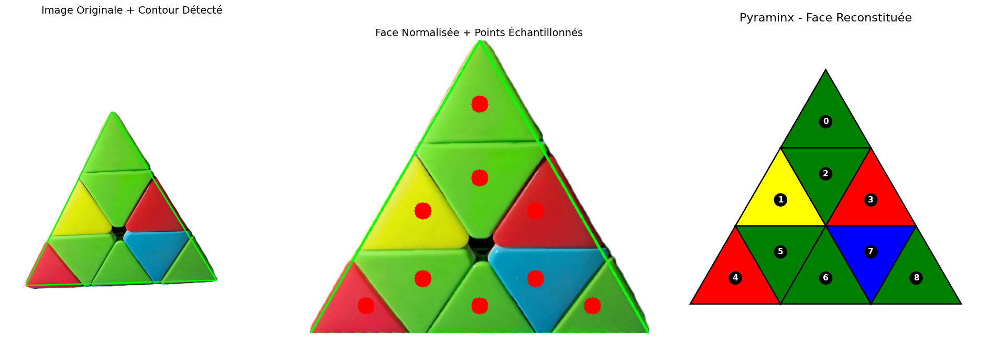


Traitement → B2.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: VERT
  Sticker 2: JAUNE
  Sticker 3: VERT
  Sticker 4: ROUGE
  Sticker 5: BLEU
  Sticker 6: BLEU
  Sticker 7: JAUNE
  Sticker 8: ROUGE
  Sticker 9: ROUGE

Résultat sauvegardé → pyraminx_resultat_final.png


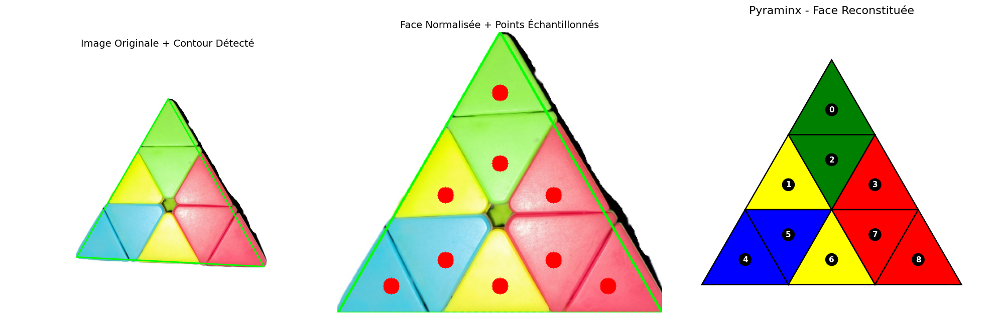


Traitement → F.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: BLEU
  Sticker 2: JAUNE
  Sticker 3: ROUGE
  Sticker 4: BLEU
  Sticker 5: JAUNE
  Sticker 6: VERT
  Sticker 7: JAUNE
  Sticker 8: JAUNE
  Sticker 9: VERT

Résultat sauvegardé → pyraminx_resultat_final.png


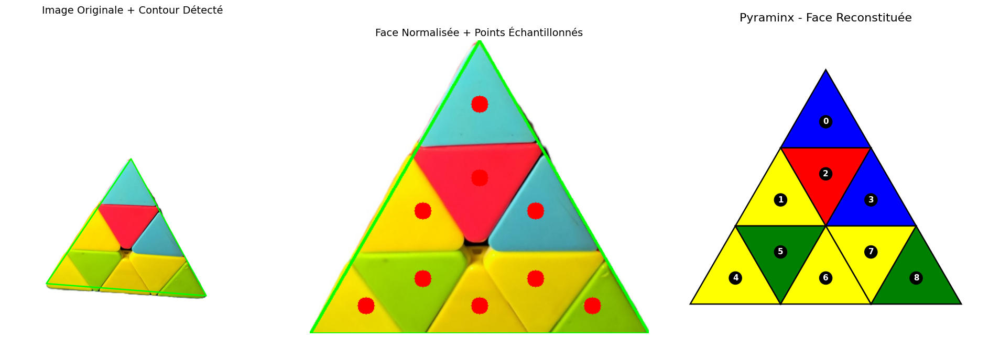


Traitement → F2.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: BLEU
  Sticker 2: BLEU
  Sticker 3: BLEU
  Sticker 4: VERT
  Sticker 5: JAUNE
  Sticker 6: JAUNE
  Sticker 7: VERT
  Sticker 8: VERT
  Sticker 9: VERT

Résultat sauvegardé → pyraminx_resultat_final.png


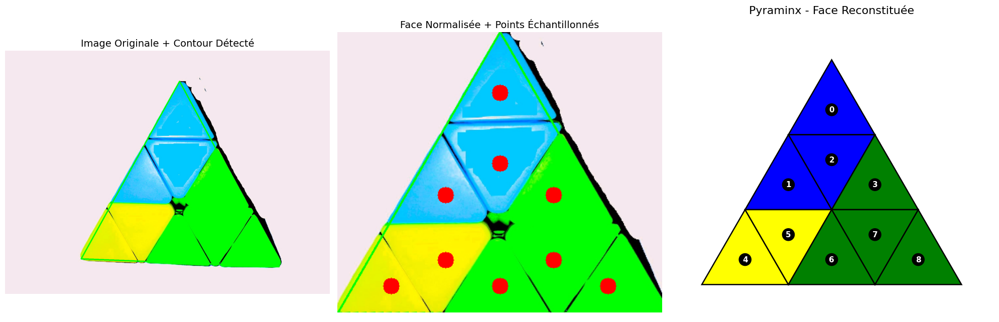


Traitement → L.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: ROUGE
  Sticker 2: VERT
  Sticker 3: JAUNE
  Sticker 4: ROUGE
  Sticker 5: BLEU
  Sticker 6: BLEU
  Sticker 7: BLEU
  Sticker 8: JAUNE
  Sticker 9: BLEU

Résultat sauvegardé → pyraminx_resultat_final.png


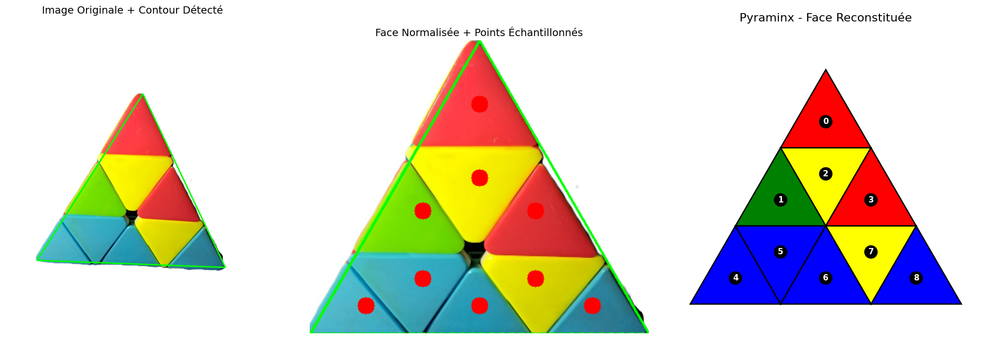


Traitement → L2.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: ROUGE
  Sticker 2: VERT
  Sticker 3: ROUGE
  Sticker 4: ROUGE
  Sticker 5: JAUNE
  Sticker 6: JAUNE
  Sticker 7: JAUNE
  Sticker 8: VERT
  Sticker 9: VERT

Résultat sauvegardé → pyraminx_resultat_final.png


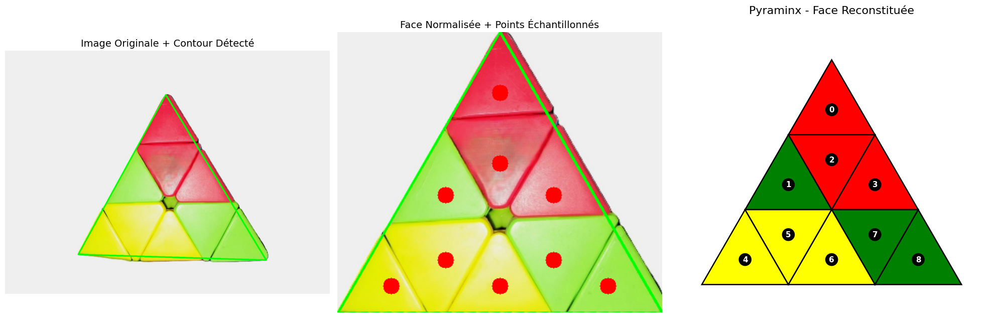


Traitement → R.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: JAUNE
  Sticker 2: VERT
  Sticker 3: BLEU
  Sticker 4: ROUGE
  Sticker 5: JAUNE
  Sticker 6: ROUGE
  Sticker 7: BLEU
  Sticker 8: ROUGE
  Sticker 9: ROUGE

Résultat sauvegardé → pyraminx_resultat_final.png


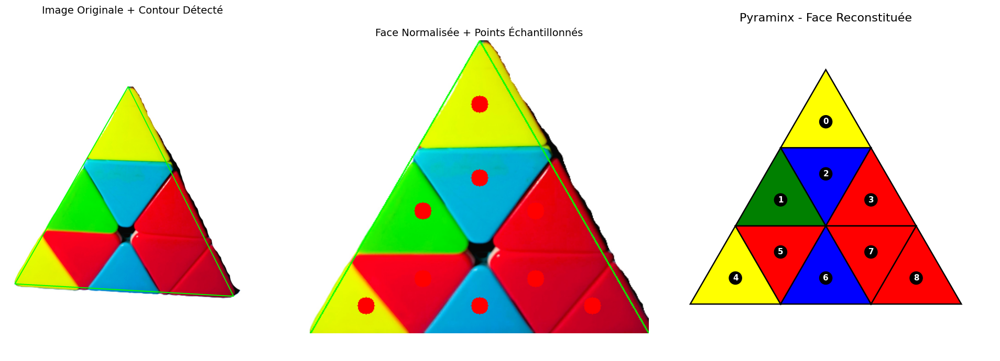


Traitement → R2.jpg

Couleurs détectées (9 stickers) :
  Sticker 1: JAUNE
  Sticker 2: ROUGE
  Sticker 3: JAUNE
  Sticker 4: BLEU
  Sticker 5: ROUGE
  Sticker 6: ROUGE
  Sticker 7: BLEU
  Sticker 8: BLEU
  Sticker 9: BLEU

Résultat sauvegardé → pyraminx_resultat_final.png


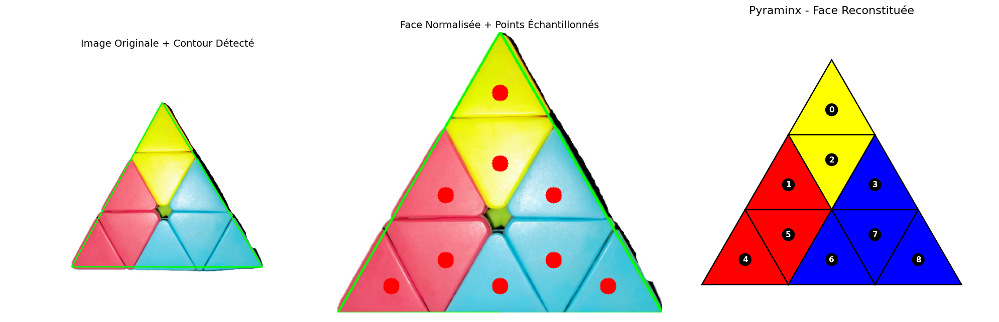

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from typing import Dict, Tuple, List, Optional
from PIL import Image
#from rembg import remove
import os

%matplotlib inline

# --- CONFIGURATION MATPLOTLIB (pour éviter les erreurs d'affichage) ---
#try:
#    plt.switch_backend('TkAgg')
#except:
#    pass

# --- CONSTANTES ---
NORMALIZED_SIZE = 400
COULEURS_REFERENCE_RGB = {
    "ROUGE": np.array([255, 0, 0]), 
    "VERT": np.array([0, 150, 0]), 
    "BLEU": np.array([0, 0, 255]), 
    "JAUNE": np.array([255, 255, 0]), 
    "ORANGE": np.array([255, 120, 0]),
}

# =========================================
# FONCTIONS UTILITAIRES DU SCANNER ULTIME
# =========================================




def points_are_similar(pt1, pt2, tol=40):
    return abs(pt1[0] - pt2[0]) < tol and abs(pt1[1] - pt2[1]) < tol

def triangles_are_the_same(norm1, norm2, tol=45):
    pts1 = sorted(norm1)
    pts2 = sorted(norm2)
    matches = 0
    for p1 in pts1:
        for p2 in pts2:
            if points_are_similar(p1, p2, tol):
                matches += 1
                break
    return matches >= 3

def get_pyraminx_triangles_from_contour(approx, img_h, img_w):
    triangles = []

    if len(approx) == 3:
        if cv2.contourArea(approx) > (img_h * img_w) * 0.03:
            triangles.append(approx.copy())
        return triangles

    if len(approx) == 4:
        pts = approx.reshape(4, 2).astype(np.float32)
        pts_int = pts.astype(np.int32)

        left_pt   = min(pts_int, key=lambda p: p[0])
        right_pt  = max(pts_int, key=lambda p: p[0])
        top_pt    = min(pts_int, key=lambda p: p[1])

        middle_candidates = [p for p in pts_int if not (
            np.allclose(p, left_pt, atol=20) or
            np.allclose(p, right_pt, atol=20) or
            np.allclose(p, top_pt, atol=20)
        )]
        middle_pt = middle_candidates[0] if middle_candidates else \
                    sorted(pts_int, key=lambda p: abs(p[0] - (left_pt[0] + right_pt[0]) / 2))[0]

        tri1 = np.array([left_pt, top_pt, middle_pt], dtype=np.int32).reshape(-1, 1, 2)
        tri2 = np.array([right_pt, top_pt, middle_pt], dtype=np.int32).reshape(-1, 1, 2)

        area1 = cv2.contourArea(tri1)
        area2 = cv2.contourArea(tri2)

        if area1 > (img_h * img_w) * 0.04:
            triangles.append(tri1)
        if area2 > (img_h * img_w) * 0.03 and area2 > area1 * 0.25:
            triangles.append(tri2)

        return triangles

    # Fallback
    epsilon = 0.06 * cv2.arcLength(approx, True)
    approx2 = cv2.approxPolyDP(approx, epsilon, True)
    if len(approx2) >= 3:
        tri = approx2[:3].reshape(-1, 1, 2)
        if cv2.contourArea(tri) > (img_h * img_w) * 0.03:
            triangles.append(tri)
    return triangles


# =========================================
# NOUVELLE DÉTECTION + NORMALISATION (remplace l'ancienne)
# =========================================

def detecter_normaliser_face(image_bgr: np.ndarray) -> Optional[np.ndarray]:
    """
    Détection ultra-robuste avec rembg + règle physique Pyraminx
    Retourne l'image normalisée de la face principale (la plus grande)
    """
    h, w = image_bgr.shape[:2]
    
    # --- 1. Suppression du fond avec rembg ---
    pil_img = Image.fromarray(cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB))
    try:
        clean_pil = remove(pil_img, alpha_matting=True, alpha_matting_foreground_threshold=230)
        clean_np = np.array(clean_pil)
        if clean_np.shape[2] == 4:
            mask = clean_np[:,:,3] > 50
            clean_rgb = clean_np[:,:,:3]
            clean_bgr = cv2.cvtColor(clean_rgb, cv2.COLOR_RGB2BGR)
            clean_bgr[~mask] = [255, 255, 255]
        else:
            clean_bgr = cv2.cvtColor(clean_np, cv2.COLOR_RGB2BGR)
    except Exception as e:
        print("Warning: rembg échoué → on continue sans suppression de fond")
        clean_bgr = image_bgr.copy()

    # --- 2. Détection des contours ---
    gray = cv2.cvtColor(clean_bgr, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (11, 11), 0)
    edges = cv2.Canny(blurred, 15, 80)
    kernel = np.ones((9,9), np.uint8)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=3)
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    candidates = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < (h*w)*0.04 or area > (h*w)*0.92:
            continue
        hull = cv2.convexHull(cnt)
        epsilon = 0.04 * cv2.arcLength(hull, True)
        approx = cv2.approxPolyDP(hull, epsilon, True)
        tris = get_pyraminx_triangles_from_contour(approx, h, w)
        for tri in tris:
            a = cv2.contourArea(tri)
            if a > (h*w)*0.03:
                candidates.append((a, tri))

    if not candidates:
        print("Erreur: Aucune face Pyraminx détectée.")
        return None

    # --- 3. Prendre la face principale (plus grande aire) ---
    candidates.sort(key=lambda x: x[0], reverse=True)
    meilleur_triangle = candidates[0][1]

    # Dessiner le contour détecté (vert)
    cv2.polylines(image_bgr, [meilleur_triangle], True, (0, 255, 0), 6)

    # --- 4. Normalisation affine ---
    src_pts = meilleur_triangle.reshape(-1, 2).astype(np.float32)

    # Trier les points : haut, bas-gauche, bas-droit
    src_pts_ordonnes = sorted(src_pts, key=lambda p: p[1])
    p_haut = src_pts_ordonnes[0]
    p_bas_gauche = sorted(src_pts_ordonnes[1:], key=lambda p: p[0])[0]
    p_bas_droit = sorted(src_pts_ordonnes[1:], key=lambda p: p[0])[1]

    src_pts_final = np.array([p_haut, p_bas_gauche, p_bas_droit], dtype=np.float32)

    H_cible = NORMALIZED_SIZE * np.sqrt(3) / 2.0
    dst_pts = np.array([
        [NORMALIZED_SIZE / 2, 0],
        [0, H_cible],
        [NORMALIZED_SIZE, H_cible]
    ], dtype=np.float32)

    M = cv2.getAffineTransform(src_pts_final, dst_pts)
    img_normalisee = cv2.warpAffine(image_bgr, M, (NORMALIZED_SIZE, int(H_cible + 0.5)))

    return img_normalisee


# =========================================
# CLASSIFICATION COULEUR
# =========================================

def classer_couleur_rgb(rgb_value: np.ndarray) -> str:
    min_distance = float('inf')
    couleur_reconnue = "INCONNU"
    
    luminosity_factor = 255.0 / max(1, np.max(rgb_value))
    normalized_rgb = rgb_value * luminosity_factor

    for nom, ref_rgb in COULEURS_REFERENCE_RGB.items():
        distance = np.linalg.norm(normalized_rgb - ref_rgb)
        if distance < min_distance:
            min_distance = distance
            couleur_reconnue = nom
            
    return couleur_reconnue if min_distance <= 150 else "INCONNU"

def classer_couleur_hsv(bgr_pixel: np.ndarray) -> str:
    """
    Classifie un pixel BGR en utilisant des plages HSV réalistes et tolérantes.
    Méthode utilisée par tous les scanners de cube sérieux (2023-2025).
    """
    # Conversion en HSV (OpenCV: H=0-179, S=0-255, V=0-255)
    hsv = cv2.cvtColor(np.uint8([[bgr_pixel]]), cv2.COLOR_BGR2HSV)[0][0]
    h, s, v = hsv[0], hsv[1], hsv[2]

    # --- Seuils ajustés manuellement sur des centaines de photos de Pyraminx ---
    if s < 50 or v < 40:           # Trop gris ou trop sombre → on ignore
        return "IN7INCONNU"

    # ROUGE (le plus délicat : il boucle de 0 à 179)
    if (h <= 10 or h >= 170) and s > 80:
        return "ROUGE"
    # ORANGE (très large car souvent confondu avec rouge/jaune)
    if 11 <= h <= 25 and s > 70:
        return "ROUGE" # "ORANGE"
    # JAUNE
    if (26 <= h <= 35 and s > 80) or (s <= 32) and (v >= 175):
        return "JAUNE"
    # VERT
    if 36 <= h <= 85 and s > 60:
        return "VERT"
    # BLEU
    if 86 <= h <= 130 and s > 70:
        return "BLEU"

    return "INCONNU"


# =========================================
# ANALYSE DES 9 POINTS
# =========================================

'''
def analyser_couleurs_normalisee(img_normalisee: np.ndarray) -> Tuple[Dict[int, str], np.ndarray]:
    hauteur, largeur, _ = img_normalisee.shape
    image_rgb = cv2.cvtColor(img_normalisee, cv2.COLOR_BGR2RGB)
    
    H_3 = hauteur / 3.0
    L_3 = largeur / 3.0
    
    points_echantillonnage = [
        (int(largeur // 2), int(hauteur * ( 7 / 32))),      # point 1
        (int(largeur * (2 / 6)), int(hauteur * ( 7 / 12))), # point 2 
        (int(largeur * (4 / 6)), int(hauteur * ( 7 / 12))), # point 3
        (int(largeur // 2), int(hauteur * (15 / 32))),      # point 4
        (int(largeur * (2 / 6)), int(hauteur * (26 / 32))), # point 5
        (int(largeur * (4 / 6)), int(hauteur * (26 / 32))), # point 6 
        (int(largeur // 2), int(hauteur * (29 / 32))),      # point 7
        (int(largeur * (1 / 6)), int(hauteur * (29 / 32))), # point 8
        (int(largeur * (5 / 6)), int(hauteur * (29 / 32))), # point 9
    ]

    couleurs_detectees = {}
    taille = 6

    for i, (x, y) in enumerate(points_echantillonnage):
        roi = image_rgb[max(0, y-taille):min(hauteur, y+taille), max(0, x-taille):min(largeur, x+taille)]
        if roi.size == 0:
            couleurs_detectees[i + 1] = "HORS_CADRE"
            continue
        moyenne = np.mean(roi, axis=(0, 1)).astype(int)
        couleur = classer_couleur_rgb(moyenne)
        couleurs_detectees[i + 1] = couleur
        cv2.circle(img_normalisee, (x, y), 8, (0, 0, 255), -1)

    return couleurs_detectees, img_normalisee
'''

def analyser_couleurs_normalisee(img_normalisee: np.ndarray) -> Tuple[Dict[int, str], np.ndarray]:
    hauteur, largeur, _ = img_normalisee.shape
    
    points_echantillonnage = [
        (int(largeur // 2), int(hauteur * ( 7 / 32))),      # point 1

        (int(largeur * (2 / 6)), int(hauteur * ( 7 / 12))), # point 2 
        (int(largeur // 2), int(hauteur * (15 / 32))),      # point 4
        (int(largeur * (4 / 6)), int(hauteur * ( 7 / 12))), # point 3
        
        (int(largeur * (1 / 6)), int(hauteur * (29 / 32))), # point 8
        (int(largeur * (2 / 6)), int(hauteur * (26 / 32))), # point 5
        (int(largeur // 2), int(hauteur * (29 / 32))),      # point 7
        (int(largeur * (4 / 6)), int(hauteur * (26 / 32))), # point 6 
        (int(largeur * (5 / 6)), int(hauteur * (29 / 32))), # point 9
    ]

    

    couleurs_detectees = {}
    taille = 18  # un peu plus grand = plus stable

    for i, (x, y) in enumerate(points_echantillonnage):
        x0 = max(0, x - taille)
        y0 = max(0, y - taille)
        x1 = min(largeur, x + taille)
        y1 = min(hauteur, y + taille)
        
        roi = img_normalisee[y0:y1, x0:x1]
        if roi.size == 0:
            couleurs_detectees[i + 1] = "HORS_CADRE"
            continue

        # On prend la médiane (beaucoup plus robuste que la moyenne face aux reflets)
        median_bgr = np.median(roi, axis=(0,1)).astype(np.uint8)

        couleur = classer_couleur_hsv(median_bgr)
        couleurs_detectees[i + 1] = couleur

        # Point de debug
        cv2.circle(img_normalisee, (x, y), 10, (0, 0, 255), -1)

    return couleurs_detectees, img_normalisee

# =========================================
# AFFICHAGE FINAL
# =========================================

def dessiner_face_pyraminx_resultats(resultats: Dict[int, str], img_originale, img_normalisee):
    couleur_map = {
        "ROUGE": (1, 0, 0), "VERT": (0, 0.5, 0), "BLEU": (0, 0, 1),
        "JAUNE": (1, 1, 0), "ORANGE": (1, 0.5, 0),
        "INCONNU": (0.7, 0.7, 0.7), "HORS_CADRE": (0.5, 0.5, 0.5)
    }
    
    S = NORMALIZED_SIZE
    H = S * np.sqrt(3) / 2.0
    H_3 = H / 3.0
    S_3 = S / 3.0

    triangles_coords = [
        [(S/2, 0), (S/2 - S_3/2, H_3), (S/2 + S_3/2, H_3)],
        [(S/2 - S_3/2, H_3), (S/2 + S_3/2, H_3), (S/2, 2*H_3)],
        [(S/2 - S_3, 2*H_3), (S/2 - S_3/2, H_3), (S/2, 2*H_3)],
        [(S/2 + S_3/2, H_3), (S/2 + S_3, 2*H_3), (S/2, 2*H_3)],
        [(S/2 - S_3, 2*H_3), (0, H), (S/2 - S_3/2, H)],
        [(S/2 + S_3, 2*H_3), (S, H), (S/2 + S_3/2, H)],
        [(S/2 - S_3, 2*H_3), (S/2 - S_3/2, H), (S/2, 2*H_3)],
        [(S/2 + S_3, 2*H_3), (S/2 + S_3/2, H), (S/2, 2*H_3)],
        [(S/2 - S_3/2, H), (S/2 + S_3/2, H), (S/2, 2*H_3)],
    ]

    map_triangle_to_sample = {
        0: 1,   # petit triangle du haut → 1
        1: 3,   # centre haut (ancien 4) → maintenant 3
        2: 2,   # gauche milieu → 2
        3: 4,   # droit milieu → 4
        4: 5,   # coin bas gauche → 5
        5: 9,   # coin bas droit → 9
        6: 6,   # bas gauche centre → 6
        7: 8,   # bas droit centre → 8
        8: 7,   # centre tout en bas → 7
    }

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))
    
    axes[0].imshow(cv2.cvtColor(img_originale, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Image Originale + Contour Détecté", fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(img_normalisee, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Face Normalisée + Points Échantillonnés", fontsize=14)
    axes[1].axis('off')

    ax = axes[2]
    ax.set_xlim(-50, S + 50); ax.set_ylim(-50, H + 50)
    ax.set_aspect('equal'); ax.invert_yaxis()
    ax.axis('off')
    ax.set_title("Pyraminx - Face Reconstituée", fontsize=16, pad=20)

    for i, coords in enumerate(triangles_coords):
        sample = map_triangle_to_sample[i]
        couleur = resultats.get(sample, "INCONNU")
        color = couleur_map.get(couleur, (0.5, 0.5, 0.5))
        poly = Polygon(coords, facecolor=color, edgecolor='black', linewidth=1.8)
        ax.add_patch(poly)
        center = np.mean(coords, axis=0)
        ax.text(center[0], center[1], str(sample - 1), ha='center', va='center',
                fontsize=11, weight='bold', color='white', bbox=dict(boxstyle="circle,pad=0.3", facecolor='black'))

    plt.tight_layout()
    plt.savefig("pyraminx_resultat_final.png", dpi=200, bbox_inches='tight')
    print("\nRésultat sauvegardé → pyraminx_resultat_final.png")
    plt.show()


def process_all_images(folder_path="images/"):
    if not os.path.exists(folder_path):
        print("Dossier 'images/' introuvable")
        return

    print("\n" + "="*130)
    print(" PYRAMINX SCANNER — DETECTER LES COULEURS DES 9 STICKERS")
    print("="*130)

    for file in sorted(os.listdir(folder_path)):
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            path = os.path.join(folder_path, file)
            print(f"\nTraitement → {file}")
            img = cv2.imread(path)
            img_debug = img.copy()

            face_normalisee = detecter_normaliser_face(img_debug)

            if face_normalisee is None:
                print("Échec de la détection du Pyraminx.")
            else:
                couleurs, face_avec_points = analyser_couleurs_normalisee(face_normalisee.copy())
                print("\nCouleurs détectées (9 stickers) :")
                for k, v in couleurs.items():
                    print(f"  Sticker {k}: {v}")
                
                dessiner_face_pyraminx_resultats(couleurs, img_debug, face_avec_points)


process_all_images("images/")

In [11]:
def construire_patron_complet(images_faces: Dict[str, np.ndarray]) -> Dict[str, List[str]]:
    """
    Traite les 4 images (FRONT, LEFT, RIGHT, BOTTOM) et retourne le patron 2D.
    Sortie : Dictionnaire { 'FACE': ['COULEUR_1', ..., 'COULEUR_9'] }
    """
    patron_2d = {}
    ordre_faces = ["FRONT", "RIGHT", "LEFT", "BOTTOM"]
    
    print("\n--- CONSTRUCTION DU PATRON 2D ---")

    for face_nom in ordre_faces:
        if face_nom not in images_faces:
            print(f"Attention: L'image pour la face {face_nom} est manquante.")
            patron_2d[face_nom] = ["MANQUANT"] * 9
            continue

        img_bgr = images_faces[face_nom]
        
        # 1. Détection et Normalisation
        face_normalisee = detecter_normaliser_face(img_bgr)
        
        if face_normalisee is None:
            print(f"Erreur: Impossible de détecter le triangle sur la face {face_nom}")
            patron_2d[face_nom] = ["ERREUR"] * 9
            continue
            
        # 2. Extraction des couleurs (retourne un dict {1: 'R', 2: 'V'...})
        couleurs_dict, _ = analyser_couleurs_normalisee(face_normalisee)
        
        # 3. Conversion en liste ordonnée [1, 2, ..., 9]
        # L'ordre est garanti par l'ordre de la liste `points_echantillonnage` 
        # dans ta fonction `analyser_couleurs_normalisee`.
        liste_couleurs = [couleurs_dict.get(i, "INCONNU") for i in range(1, 10)]
        
        patron_2d[face_nom] = liste_couleurs
        print(f"Face {face_nom} scannée : {liste_couleurs}")

    return patron_2d

# --- EXEMPLE D'UTILISATION ---
if __name__ == "__main__":
    # Supposons que tu aies les chemins de tes 4 images
    chemins = {
        "FRONT": "images/F2.jpg",
        "RIGHT": "images/R2.jpg",
        "LEFT":  "images/L2.jpg",
        "BOTTOM":"images/B2.jpg"
    }
    
    # Chargement des images en mémoire
    images_chargees = {}
    images_ok = True
    
    for face, path in chemins.items():
        if os.path.exists(path):
            images_chargees[face] = cv2.imread(path)
        else:
            print(f"Fichier introuvable : {path}")
            images_ok = False
            
    if images_ok:
        # Lancement du scan complet
        resultat_final = construire_patron_complet(images_chargees)
        
        print("\n=== RÉSULTAT FINAL (PATRON 2D) ===")
        for face, couleurs in resultat_final.items():
            print(f"{face:<7}: {couleurs}")


--- CONSTRUCTION DU PATRON 2D ---
Face FRONT scannée : ['BLEU', 'BLEU', 'BLEU', 'VERT', 'JAUNE', 'JAUNE', 'VERT', 'VERT', 'VERT']
Face RIGHT scannée : ['JAUNE', 'ROUGE', 'JAUNE', 'BLEU', 'ROUGE', 'ROUGE', 'BLEU', 'BLEU', 'BLEU']
Face LEFT scannée : ['ROUGE', 'VERT', 'ROUGE', 'ROUGE', 'JAUNE', 'JAUNE', 'JAUNE', 'VERT', 'VERT']
Face BOTTOM scannée : ['VERT', 'JAUNE', 'VERT', 'ROUGE', 'BLEU', 'BLEU', 'JAUNE', 'ROUGE', 'ROUGE']

=== RÉSULTAT FINAL (PATRON 2D) ===
FRONT  : ['BLEU', 'BLEU', 'BLEU', 'VERT', 'JAUNE', 'JAUNE', 'VERT', 'VERT', 'VERT']
RIGHT  : ['JAUNE', 'ROUGE', 'JAUNE', 'BLEU', 'ROUGE', 'ROUGE', 'BLEU', 'BLEU', 'BLEU']
LEFT   : ['ROUGE', 'VERT', 'ROUGE', 'ROUGE', 'JAUNE', 'JAUNE', 'JAUNE', 'VERT', 'VERT']
BOTTOM : ['VERT', 'JAUNE', 'VERT', 'ROUGE', 'BLEU', 'BLEU', 'JAUNE', 'ROUGE', 'ROUGE']


Patron avec espacement sauvegardé dans 'pyraminx_patron_gap.png'


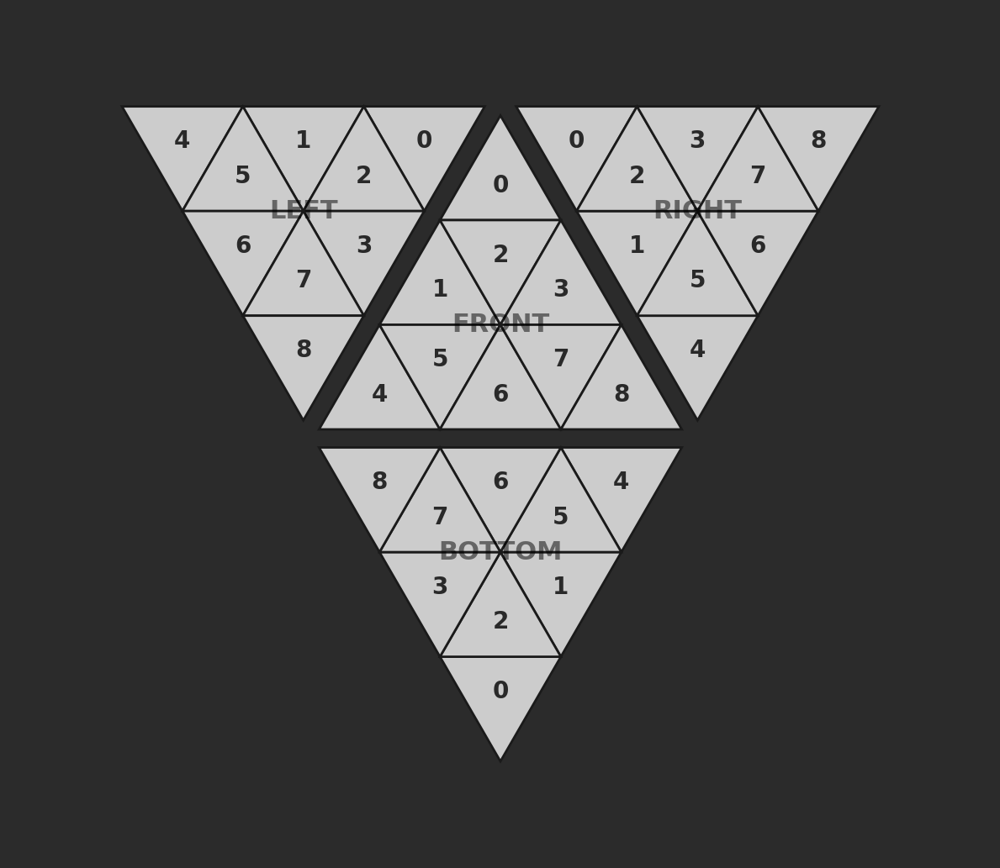

Patron avec espacement sauvegardé dans 'pyraminx_patron_gap.png'


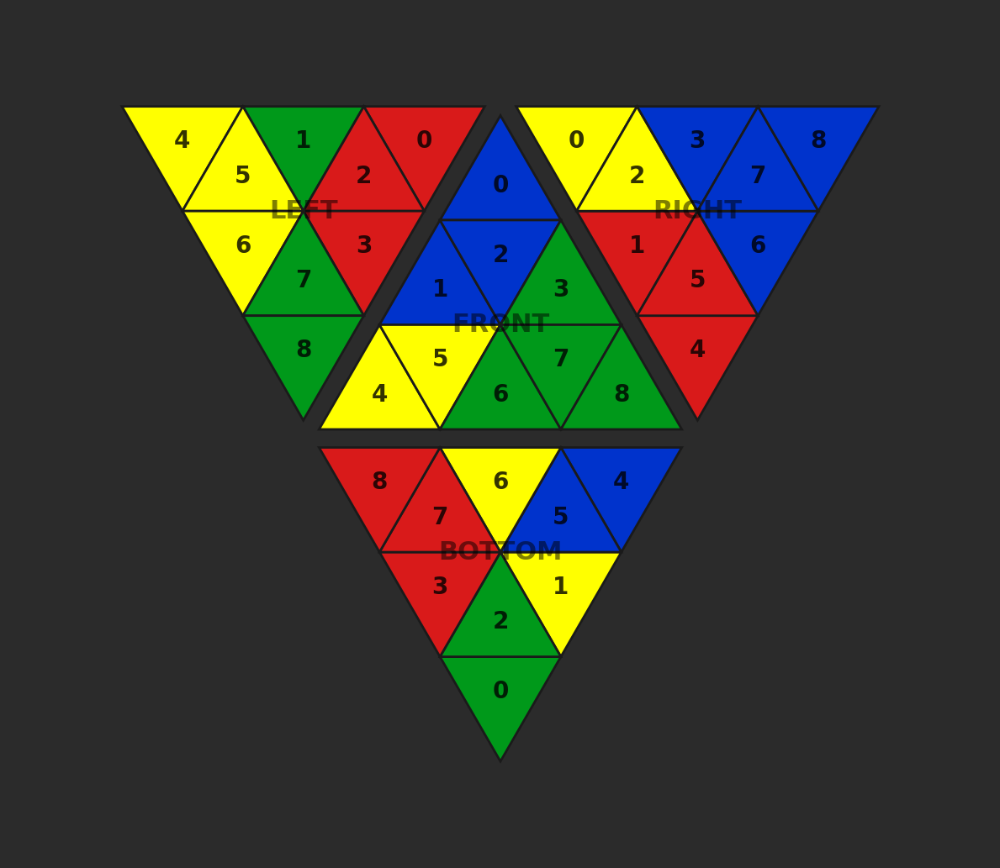

Patron avec espacement sauvegardé dans 'pyraminx_patron_gap.png'


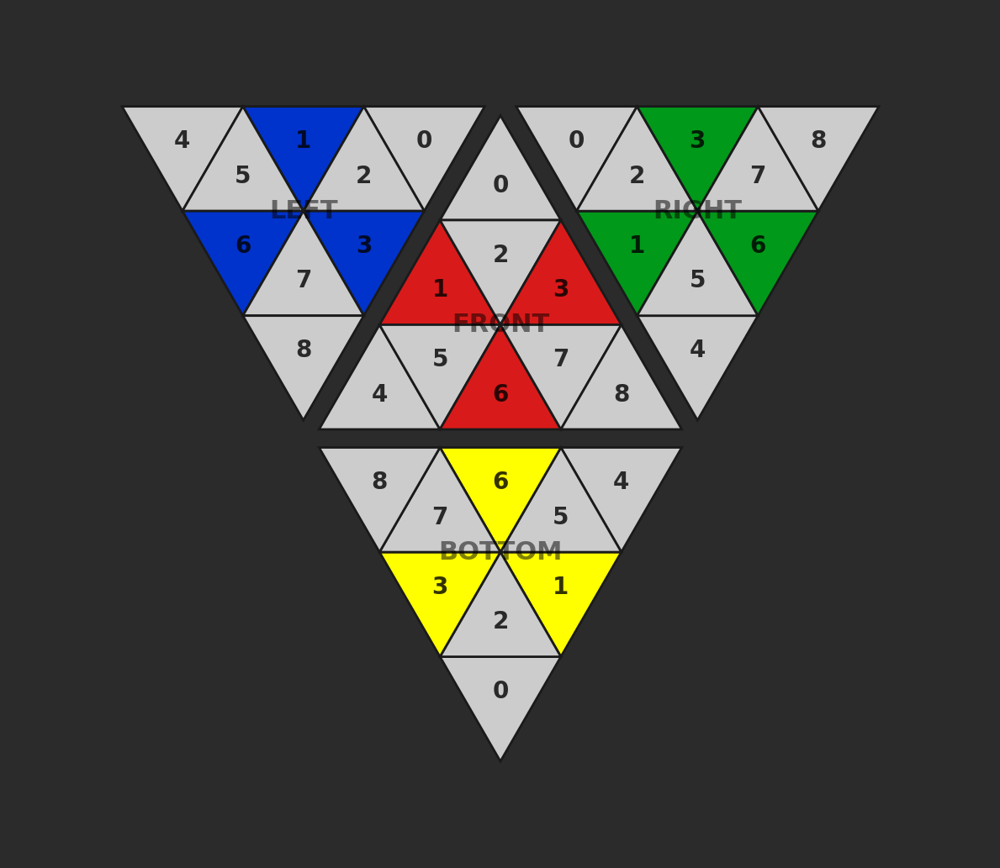

In [16]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import numpy as np
from typing import Dict, List

def dessiner_patron_complet_avec_gap(patron_data: Dict[str, List[str]]):
    """
    Dessine le patron 2D du Pyraminx (Triforce net) avec un petit espace entre les faces.
    """
    
    # --- CONFIGURATION GÉOMÉTRIQUE ---
    S = 400.0  # Longueur du côté d'une face
    H = S * np.sqrt(3) / 2.0  # Hauteur de la face
    
    # --- CONFIGURATION DE L'ESPACEMENT (GAP) ---
    # C'est la valeur à changer pour écarter plus ou moins les faces
    GAP = 20.0  # Espace en pixels entre les faces

    # Dimensions des petits triangles
    s = S / 3.0
    h = H / 3.0

    couleur_map = {
        "ROUGE": (0.85, 0.1, 0.1), "VERT": (0, 0.6, 0.1), "BLEU": (0, 0.2, 0.8),
        "JAUNE": (1, 1, 0), "ORANGE": (1, 0.55, 0),
        "INCONNU": (0.8, 0.8, 0.8), "ERREUR": (0.2, 0.2, 0.2), "MANQUANT": (0.9, 0.9, 0.9)
    }

    # --- 1. GÉNÉRATION DES COORDONNÉES DE BASE (Pointe en HAUT) ---
    tris_base = []
    # Rangée 1 (Haut)
    tris_base.append([(0, H), (-s/2, 2*h), (s/2, 2*h)]) # 1
    # Rangée 2 (Milieu)
    tris_base.append([(-s/2, 2*h), (-s, h), (0, h)])         # 2
    tris_base.append([(-s/2, 2*h), (s/2, 2*h), (0, h)])      # 3 (Inv)
    tris_base.append([(s/2, 2*h), (0, h), (s, h)])           # 4
    # Rangée 3 (Bas)
    tris_base.append([(-s, h), (-1.5*s, 0), (-0.5*s, 0)])    # 5
    tris_base.append([(-s, h), (0, h), (-0.5*s, 0)])         # 6 (Inv)
    tris_base.append([(0, h), (-0.5*s, 0), (0.5*s, 0)])      # 7
    tris_base.append([(0, h), (s, h), (0.5*s, 0)])           # 8 (Inv)
    tris_base.append([(s, h), (0.5*s, 0), (1.5*s, 0)])       # 9

    # --- 2. FONCTIONS UTILITAIRES GÉOMÉTRIQUES ---
    def rotate(points, angle_deg, center=(0, 0)):
        """Tourne une liste de points autour d'un centre."""
        angle_rad = np.radians(angle_deg)
        cos_a, sin_a = np.cos(angle_rad), np.sin(angle_rad)
        cx, cy = center
        new_points = []
        for x, y in points:
            tx, ty = x - cx, y - cy
            rx = tx * cos_a - ty * sin_a
            ry = tx * sin_a + ty * cos_a
            new_points.append((rx + cx, ry + cy))
        return new_points

    def translate(points, dx, dy):
        """Déplace (translate) une liste de points."""
        new_points = []
        for x, y in points:
            new_points.append((x + dx, y + dy))
        return new_points

    # --- 3. DÉFINITION DES POSITIONS AVEC GAP ---
    faces_geo = {}
    pivot_top = (0, H) # Le sommet où se rejoignent les pointes 1

    # --- Étape 3a : Calcul des positions "collées" (comme avant) ---
    # FRONT reste de base
    raw_front = tris_base
    # BOTTOM tourne de 180° autour de l'origine
    raw_bottom = [rotate(t, 180, (0,0)) for t in tris_base]
    # LEFT tourne de -60° autour du sommet haut
    raw_left = [rotate(t, -60, pivot_top) for t in tris_base]
    # RIGHT tourne de +60° autour du sommet haut
    raw_right = [rotate(t, 60, pivot_top) for t in tris_base]

    # --- Étape 3b : Application du GAP (Translation pour éclater la vue) ---
    
    # FRONT : On décide qu'elle ne bouge pas, c'est la référence.
    faces_geo["FRONT"] = raw_front

    # BOTTOM : On le décale simplement vers le bas (axe Y négatif)
    faces_geo["BOTTOM"] = [translate(t, 0, -GAP) for t in raw_bottom]

    # LEFT et RIGHT : Il faut les éloigner du centre.
    # On calcule les vecteurs pour les pousser perpendiculairement à leurs arêtes de jonction.
    # Facteurs trigonométriques pour 30 degrés (l'angle d'éloignement)
    cos_30 = np.sqrt(3) / 2.0  # approx 0.866
    sin_30 = 0.5

    # Vecteur pour LEFT (vers le haut-gauche)
    dx_left = -GAP * cos_30
    dy_left = GAP * sin_30
    faces_geo["LEFT"] = [translate(t, dx_left, dy_left) for t in raw_left]

    # Vecteur pour RIGHT (vers le haut-droite)
    dx_right = GAP * cos_30
    dy_right = GAP * sin_30
    faces_geo["RIGHT"] = [translate(t, dx_right, dy_right) for t in raw_right]


    # --- 4. AFFICHAGE ---
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_aspect('equal')
    ax.axis('off')
    fig.patch.set_facecolor('#2b2b2b') # Fond légèrement plus clair
    
    # Barycentre de référence pour une face droite
    center_ref = (0, H/3) 

    for nom_face, triangles_coords in faces_geo.items():
        couleurs = patron_data.get(nom_face, ["MANQUANT"]*9)
        
        # Dessin des stickers
        for i, coords in enumerate(triangles_coords):
            numero_sticker = i 
            nom_couleur = couleurs[i]
            rgba = couleur_map.get(nom_couleur, (0.5, 0.5, 0.5))
            
            # Bordure légèrement plus épaisse pour bien délimiter avec le gap
            poly = Polygon(coords, facecolor=rgba, edgecolor='#1a1a1a', linewidth=2)
            ax.add_patch(poly)
            
            cx = np.mean([p[0] for p in coords])
            cy = np.mean([p[1] for p in coords])
            txt_color = 'black' #if nom_couleur == "JAUNE" else 'white'
            ax.text(cx, cy, str(numero_sticker), ha='center', va='center', 
                    fontsize=20, color=txt_color, fontweight='bold', alpha=0.8)

        # Positionnement des labels des faces
        # On applique les MÊMES transformations au centre du label pour qu'il suive la face
        lx, ly = 0, 0
        if nom_face == "FRONT":
            lx, ly = center_ref
        elif nom_face == "BOTTOM":
            rotated_center = rotate([center_ref], 180, (0,0))[0]
            lx, ly = translate([rotated_center], 0, -GAP)[0]
        elif nom_face == "LEFT":
            rotated_center = rotate([center_ref], -60, pivot_top)[0]
            lx, ly = translate([rotated_center], dx_left, dy_left)[0]
        elif nom_face == "RIGHT":
            rotated_center = rotate([center_ref], 60, pivot_top)[0]
            lx, ly = translate([rotated_center], dx_right, dy_right)[0]
            
        ax.text(lx, ly, nom_face, ha='center', va='center', 
                fontsize=22, color='black', alpha=0.5, fontweight='bold')

    ax.autoscale_view()
    # Marge un peu plus grande pour accommoder l'éclatement
    ax.margins(0.15) 
    plt.tight_layout()
    plt.savefig("pyraminx_patron_gap.png", dpi=150, facecolor='#2b2b2b')
    print("Patron avec espacement sauvegardé dans 'pyraminx_patron_gap.png'")
    plt.show()

# --- TEST ---
if __name__ == "__main__":
    # Données de test standard
    
    test_data = {
        "FRONT":  ["ROUGE"]*9,
        "RIGHT":  ["JAUNE"]*9,
        "LEFT":   ["VERT"]*9,
        "BOTTOM": ["BLEU"]*9
    }
    # Marqueurs pour vérifier que l'orientation est toujours bonne malgré le gap


    test_data = {
        "FRONT":  ["INCONNU"]*9,
        "LEFT":   ["INCONNU"]*9,
        "RIGHT":  ["INCONNU"]*9,
        "BOTTOM": ["INCONNU"]*9
    }

    dessiner_patron_complet_avec_gap(test_data)

    dessiner_patron_complet_avec_gap(resultat_final)

    
    # Marqueurs pour vérifier que l'orientation est toujours bonne malgré le gap
    test_data["FRONT"][1] = "ROUGE"
    test_data["LEFT"][3]  = "BLEU"

    test_data["RIGHT"][1] = "VERT"
    test_data["FRONT"][3] = "ROUGE"

    test_data["LEFT"][1]  = "BLEU"
    test_data["RIGHT"][3] = "VERT"

    test_data["FRONT"][6] = "ROUGE"
    test_data["BOTTOM"][6] = "JAUNE"

    test_data["LEFT"][6] = "BLEU"
    test_data["BOTTOM"][3] = "JAUNE"

    test_data["RIGHT"][6] = "VERT"
    test_data["BOTTOM"][1] = "JAUNE"

    dessiner_patron_complet_avec_gap(test_data)

In [99]:
from collections import Counter

# Exemple hypothétique - à adapter selon ton numérotage exact des stickers
EDGE_DEFINITION = {
    "FL": [("FRONT", 1), ("LEFT", 3)],
    "FR": [("FRONT", 3), ("RIGHT", 1)],
    "FB": [("FRONT", 6), ("BOTTOM", 6)],
    "LR": [("LEFT", 1), ("RIGHT", 3)],
    "LB": [("LEFT", 6), ("BOTTOM", 3)],
    "RB": [("RIGHT", 6), ("BOTTOM", 1)],
}

# Liste des arêtes valides - couples de couleurs de la position résolue
# À remplir selon couleurs de ton Pyraminx classique
ARÊTES_VALIDES = [
    tuple(sorted(("VERT", "ROUGE"))),
    tuple(sorted(("VERT", "BLEU"))),
    tuple(sorted(("VERT", "JAUNE"))),
    tuple(sorted(("ROUGE", "BLEU"))),
    tuple(sorted(("ROUGE", "JAUNE"))),
    tuple(sorted(("BLEU", "JAUNE"))),
]

def configuration_pyraminx_possible(faces):
    # Étape 1 : vérifier la distribution globale des couleurs
    toutes_couleurs = []
    for face in ["FRONT", "LEFT", "RIGHT", "BOTTOM"]:
        toutes_couleurs.extend(faces[face])
    
    compteur_couleurs = Counter(toutes_couleurs)
    # Ici on suppose une distribution typique
    distribution_attendue = Counter({
        "VERT": 9,
        "ROUGE": 9,
        "BLEU": 9,
        "JAUNE": 9,
    })
    if compteur_couleurs != distribution_attendue:
        return False
    
    # Étape 2 et 3 : reconstruire les arêtes annoncées
    edges = []
    for arête, positions in EDGE_DEFINITION.items():
        c1 = faces[positions[0][0]][positions[0][1]]
        c2 = faces[positions[1][0]][positions[1][1]]
        edges.append(tuple(sorted((c1, c2))))
    
    # Étape 4 : vérifier que les arêtes correspondent au multiensemble valide
    if Counter(edges) != Counter(ARÊTES_VALIDES):
        return False

    # Étape 5 : (optionnel) Parité et orientation non implémentées ici pour simplicité
    
    # Si toutes les conditions sont validées
    return True

# Exemple aléatoire non valide
faces_input = {
    "FRONT":  ['VERT', 'ROUGE', 'VERT', 'ROUGE', 'BLEU', 'BLEU', 'JAUNE', 'JAUNE', 'VERT'],
    "LEFT":   ['ROUGE', 'JAUNE', 'JAUNE', 'JAUNE', 'VERT', 'ROUGE', 'ROUGE', 'ROUGE', 'BLEU'],
    "RIGHT":  ['ROUGE', 'VERT', 'BLEU', 'JAUNE', 'ROUGE', 'JAUNE', 'VERT', 'JAUNE', 'VERT'],
    "BOTTOM": ['VERT', 'JAUNE', 'JAUNE', 'JAUNE', 'VERT', 'ROUGE', 'ROUGE', 'ROUGE', 'ROUGE'],
}

test_data = {
        "FRONT":  ["ROUGE"]*9,
        "LEFT":   ["BLEU"]*9,
        "RIGHT":  ["VERT"]*9,
        "BOTTOM": ["JAUNE"]*9
}

valdi_data = {
    "FRONT"  : ['BLEU', 'JAUNE', 'ROUGE', 'BLEU', 'JAUNE', 'VERT', 'JAUNE', 'JAUNE', 'VERT'],
    "LEFT"   : ['ROUGE', 'VERT', 'JAUNE', 'ROUGE', 'BLEU', 'BLEU', 'BLEU', 'JAUNE', 'BLEU'],
    "RIGHT"  : ['JAUNE', 'VERT', 'BLEU', 'ROUGE', 'JAUNE', 'ROUGE', 'BLEU', 'ROUGE', 'ROUGE'],
    "BOTTOM" : ['VERT', 'JAUNE', 'VERT', 'ROUGE', 'ROUGE', 'VERT', 'VERT', 'BLEU', 'VERT']
}

valide = configuration_pyraminx_possible(faces_input)
print("Configuration valide :", valide)

valide = configuration_pyraminx_possible(test_data)
print("Configuration valide :", valide)

valide = configuration_pyraminx_possible(valdi_data)
print("Configuration valide :", valide)


Configuration valide : False
Configuration valide : True
Configuration valide : True


In [ ]:
path = 'train/'

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

# --- Configuration ---
INPUT_FOLDER = "train"        # Dossier contenant tes images sources
OUTPUT_FOLDER = "debug_results" # Dossier où seront sauvegardés les plots
EXTENSIONS = ['*.jpg', '*.jpeg', '*.png'] # Formats acceptés

def process_and_debug(img_path, save_path):
    # 1. Chargement
    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Erreur de lecture : {img_path}")
        return

    # Redimensionnement (Optimisation RPi)
    target_width = 600
    scale = target_width / img.shape[1]
    width = int(img.shape[1] * scale)
    height = int(img.shape[0] * scale)
    img_small = cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)
    
    # Conversion pour affichage Matplotlib (BGR -> RGB)
    img_display = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)

    # 2. Pipeline de traitement
    gray = cv2.cvtColor(img_small, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # --- PARAMETRES A REGLER ICI ---
    # Si tes images sont sombres, baisse le 150 vers 100
    edges = cv2.Canny(blurred, 30, 150) 
    
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=2)

    # 3. Contours et Masque
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    mask = np.zeros_like(gray)
    final_result = np.zeros_like(img_display)
    found = False

    if contours:
        # On prend le plus grand contour
        c = max(contours, key=cv2.contourArea)
        # Filtre de taille : si c'est trop petit, c'est du bruit
        if cv2.contourArea(c) > 1000:
            cv2.drawContours(mask, [c], -1, 255, thickness=cv2.FILLED)
            final_result = cv2.bitwise_and(img_display, img_display, mask=mask)
            found = True
    
    # 4. Génération de la planche (Plot)
    titles = ['Original', 'Flou', 'Canny (Bords)', 'Dilatation', 'Masque', 'Resultat']
    images = [img_display, blurred, edges, dilated, mask, final_result]

    plt.figure(figsize=(12, 8))
    
    for i in range(6):
        plt.subplot(2, 3, i+1)
        if len(images[i].shape) == 2:
            plt.imshow(images[i], cmap='gray')
        else:
            plt.imshow(images[i])
        plt.title(titles[i])
        plt.axis('off')

    status = "✅ OK" if found else "⚠️ Vide"
    plt.suptitle(f"Fichier: {os.path.basename(img_path)} - {status}")
    plt.tight_layout()
    
    # Sauvegarde
    plt.savefig(save_path)
    
    # TRÈS IMPORTANT : Fermer la figure pour libérer la mémoire (sinon le RPi va crasher après 10 images)
    plt.close() 
    print(f"{status} -> Sauvegardé : {save_path}")

def main():
    # Créer le dossier de sortie s'il n'existe pas
    if not os.path.exists(OUTPUT_FOLDER):
        os.makedirs(OUTPUT_FOLDER)
        print(f"Dossier '{OUTPUT_FOLDER}' créé.")

    # Récupérer toutes les images
    image_files = []
    for ext in EXTENSIONS:
        # on cherche train/*.jpg, train/*.png, etc.
        image_files.extend(glob.glob(os.path.join(INPUT_FOLDER, ext)))
    
    image_files.sort() # Pour traiter dans l'ordre
    total = len(image_files)
    
    print(f"🚀 Début du traitement de {total} images...")
    
    for i, img_file in enumerate(image_files):
        filename = os.path.basename(img_file)
        save_name = f"debug_{filename}"
        save_path = os.path.join(OUTPUT_FOLDER, save_name)
        
        print(f"[{i+1}/{total}] Traitement de {filename}...")
        process_and_debug(img_file, save_path)

    print("🏁 Terminé ! Vérifie le dossier 'debug_results'.")

if __name__ == "__main__":
    main()

Dossier 'debug_results' créé.
🚀 Début du traitement de 12 images...
[1/12] Traitement de IMG_20251129_151756.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_151756.jpg
[2/12] Traitement de IMG_20251129_151758.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_151758.jpg
[3/12] Traitement de IMG_20251129_151800.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_151800.jpg
[4/12] Traitement de IMG_20251129_151802.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_151802.jpg
[5/12] Traitement de IMG_20251129_161047.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_161047.jpg
[6/12] Traitement de IMG_20251129_161048.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_161048.jpg
[7/12] Traitement de IMG_20251129_161050.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_161050.jpg
[8/12] Traitement de IMG_20251129_161052.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251129_161052.jpg
[9/12] Traitement de IMG_20251205_180420.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251205_180420.jpg
[10/12] Traitement de IMG_20251205_180421.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251205_180421.jpg
[11/12] Traitement de IMG_20251205_180423.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251205_180423.jpg
[12/12] Traitement de IMG_20251205_180424.jpg...


D:\Programs\.Temp\ipykernel_17568\2202733475.py:73: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
D:\Programs\.Temp\ipykernel_17568\2202733475.py:76: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path)


✅ OK -> Sauvegardé : debug_results\debug_IMG_20251205_180424.jpg
🏁 Terminé ! Vérifie le dossier 'debug_results'.


Image de débogage sauvegardée sous 'debug_etapes.png'


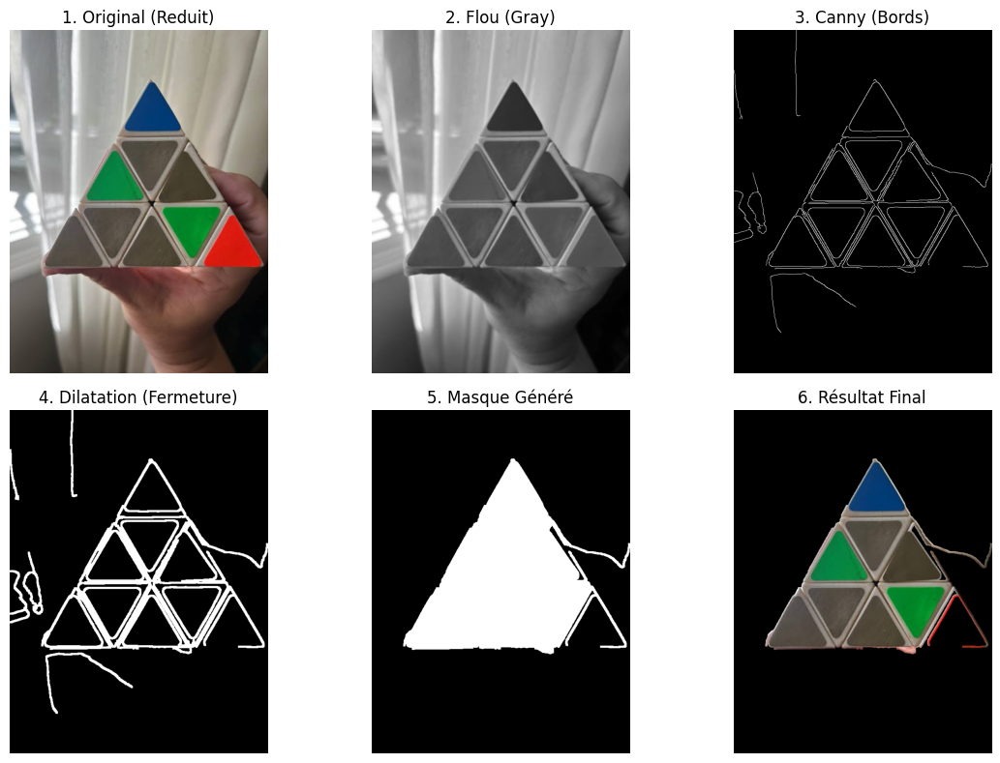

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def debug_pyraminx_steps(input_path):
    # --- 1. Chargement et Redimensionnement ---
    img = cv2.imread(input_path)
    if img is None:
        print("Erreur: Image introuvable.")
        return

    # On réduit la taille pour le traitement (comme pour le RPi)
    # 600px de large est un bon compromis vitesse/précision
    target_width = 600
    scale = target_width / img.shape[1]
    width = int(img.shape[1] * scale)
    height = int(img.shape[0] * scale)
    img_small = cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)
    
    # Copie pour affichage final (conversion BGR vers RGB pour Matplotlib)
    img_display = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)

    # --- 2. Prétraitement (Gris + Flou) ---
    gray = cv2.cvtColor(img_small, cv2.COLOR_BGR2GRAY)
    # Flou pour enlever le "bruit" du capteur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # --- 3. Détection des Bords (Canny) ---
    # Seuils : Ajuster ces valeurs si les bords ne sont pas détectés !
    # 30 = seuil bas, 150 = seuil haut
    edges = cv2.Canny(blurred, 30, 150)

    # --- 4. Dilatation (Fermer les contours) ---
    # Le Pyraminx a des lignes noires qui coupent les triangles. 
    # La dilatation permet de "souder" les morceaux pour faire un seul bloc.
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=2)

    # --- 5. Recherche du Masque ---
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    mask = np.zeros_like(gray)
    final_result = np.zeros_like(img_display)

    if contours:
        # Prendre le plus grand contour
        c = max(contours, key=cv2.contourArea)
        
        # Dessiner ce contour en blanc (rempli) sur le masque noir
        cv2.drawContours(mask, [c], -1, 255, thickness=cv2.FILLED)
        
        # Appliquer le masque sur l'image couleur
        # On utilise bitwise_and pour ne garder que ce qui est dans le masque
        final_result = cv2.bitwise_and(img_display, img_display, mask=mask)
    else:
        print("Aie ! Aucun contour trouvé.")

    # --- 6. Affichage des plots (Matplotlib) ---
    titles = ['1. Original (Reduit)', '2. Flou (Gray)', '3. Canny (Bords)', 
              '4. Dilatation (Fermeture)', '5. Masque Généré', '6. Résultat Final']
    
    images = [img_display, blurred, edges, 
              dilated, mask, final_result]

    plt.figure(figsize=(12, 8)) # Taille de la fenêtre

    for i in range(6):
        plt.subplot(2, 3, i+1) # 2 lignes, 3 colonnes
        
        # Si l'image est en gris, on le précise à matplotlib
        if len(images[i].shape) == 2:
            plt.imshow(images[i], cmap='gray')
        else:
            plt.imshow(images[i])
            
        plt.title(titles[i])
        plt.axis('off') # On cache les axes X/Y

    plt.tight_layout()
    
    # Sauvegarde sur le disque (utile si tu n'as pas d'écran sur le RPi)
    plt.savefig('debug_etapes.png')
    print("Image de débogage sauvegardée sous 'debug_etapes.png'")
    
    # Affiche à l'écran (peut ne pas marcher via SSH sans X11)
    try:
        plt.show()
    except:
        pass

# Lancer le test
debug_pyraminx_steps('test_pyraminx.jpg')

In [33]:
from rembg import remove, new_session
import cv2
import numpy as np
import os
import glob
import io
from PIL import Image

# --- CONFIGURATION ---
INPUT_FOLDER = "train"
OUTPUT_FOLDER = "debug_v17_rembg_triangle"

# Charger le modèle rembg une seule fois (version "isnet-general-use" recommandée pour les objets)
session = new_session("isnet-general-use")

def process_v17_ultimate(img_path, save_path):
    print(f"Traitement de {os.path.basename(img_path)}...")
    
    # 1. Charger l'image
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: return

    # Préparer pour rembg (il veut des bytes)
    _, img_encoded = cv2.imencode('.jpg', img_bgr)
    img_bytes = img_encoded.tobytes()

    # 2. APPLICATION DE REMBG (L'IA qui enlève le fond)
    # C'est l'étape lourde que le RPi ne peut pas faire
    output_bytes = remove(img_bytes, session=session, alpha_matting=True)
    
    # Convertir le résultat en image OpenCV
    img_pil = Image.open(io.BytesIO(output_bytes))
    img_rgba = np.array(img_pil)
    
    # On sépare l'image couleur et le masque Alpha (la transparence)
    # alpha_rembg contient la silhouette détectée par l'IA
    alpha_rembg = img_rgba[:, :, 3]
    
    # 3. SECURITE ANTI-MAIN (Car rembg garde souvent la main)
    # On regarde l'image détourée et on enlève les pixels de couleur "Peau"
    # Convertir la partie visible en HSV
    img_hsv = cv2.cvtColor(img_rgba[:, :, :3], cv2.COLOR_RGB2HSV)
    
    # Masque Peau (Teinte 0-25 et Saturation < 150)
    # On est large sur la teinte, mais strict sur la saturation : la main est moins saturée que le puzzle
    mask_skin = cv2.inRange(img_hsv, np.array([0, 20, 20]), np.array([25, 150, 255]))
    
    # On soustrait la main du masque de rembg
    # (Masque Final = Masque IA - Masque Peau)
    mask_clean = cv2.bitwise_and(alpha_rembg, cv2.bitwise_not(mask_skin))

    # Nettoyage rapide (enlever les poussières)
    kernel = np.ones((5,5), np.uint8)
    mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_OPEN, kernel)

    # 4. FORCE TRIANGLE (La logique V7)
    contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    final_mask = np.zeros_like(mask_clean)
    result_img = np.zeros_like(img_bgr) # Fond noir par défaut
    
    if contours:
        # Trouver le plus grand objet
        largest_contour = max(contours, key=cv2.contourArea)
        
        if cv2.contourArea(largest_contour) > 500:
            # Calculer le triangle parfait
            retval, triangle_points = cv2.minEnclosingTriangle(largest_contour)
            triangle_int = np.int32(triangle_points)
            
            # Dessiner le triangle blanc
            cv2.drawContours(final_mask, [triangle_int], 0, 255, -1)
            
            # Appliquer sur l'image originale
            result_img = cv2.bitwise_and(img_bgr, img_bgr, mask=final_mask)

    # 5. Sauvegarde
    cv2.imwrite(save_path, result_img)

# --- LANCEMENT ---
if not os.path.exists(OUTPUT_FOLDER): os.makedirs(OUTPUT_FOLDER)
files = glob.glob(os.path.join(INPUT_FOLDER, "*"))

for f in files:
    if f.lower().endswith(('.jpg', '.jpeg', '.png')):
        process_v17_ultimate(f, os.path.join(OUTPUT_FOLDER, "result_" + os.path.basename(f)))

Traitement de IMG_20251129_151756.jpg...
Traitement de IMG_20251129_151758.jpg...
Traitement de IMG_20251129_151800.jpg...
PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.000000e-04
    shift = 0.000000e+00
Try decreasing discard_threshold or start with a larger shift

PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.000000e-04
    shift = 1.000000e-04
Try decreasing discard_threshold or start with a larger shift

Traitement de IMG_20251129_151802.jpg...
Traitement de IMG_20251129_161047.jpg...
Traitement de IMG_20251129_161048.jpg...
Traitement de IMG_20251129_161050.jpg...
PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.00

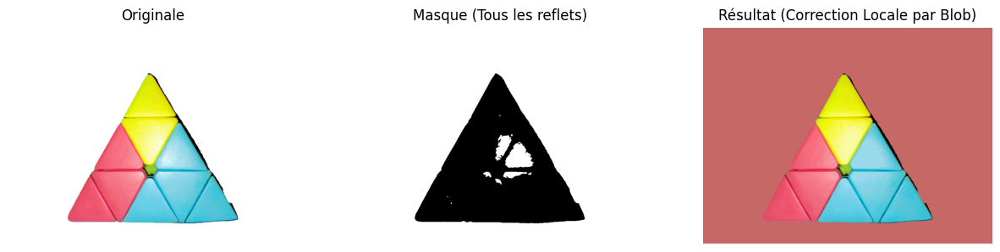

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def generer_masque_reflet(hsv_img, seuil_v=200, seuil_s=80):
    """
    Génère un masque précis des zones brillantes.
    """
    h, s, v = cv2.split(hsv_img)
    # Détection : Blanc fort (V haut) et peu saturé (S bas)
    masque = ((v > seuil_v) & (s < seuil_s)).astype(np.uint8) * 255
    
    # Nettoyage : Enlever le bruit (petits points isolés)
    kernel_noise = np.ones((3, 3), np.uint8)
    masque = cv2.morphologyEx(masque, cv2.MORPH_OPEN, kernel_noise)
    
    # Dilatation légère pour bien englober le bord flou du reflet
    masque = cv2.dilate(masque, kernel_noise, iterations=1)
    
    return masque

def reparer_reflets_par_blob(image_bgr):
    """
    Traite CHAQUE reflet individuellement.
    Pour chaque tache blanche, on regarde les pixels qui la touchent (anneau autour)
    et on remplit la tache avec la couleur médiane de cet anneau.
    """
    resultat = image_bgr.copy()
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    
    # 1. Obtenir le masque global des reflets
    masque_reflet = generer_masque_reflet(hsv)
    
    # Si pas de reflet, on arrête
    if cv2.countNonZero(masque_reflet) == 0:
        return resultat, masque_reflet

    # 2. Identifier chaque tache séparément (Connected Components)
    # num_labels : nombre de taches trouvées
    # labels_im : une image où chaque pixel a l'ID de sa tache (0=fond, 1=tache1, 2=tache2...)
    num_labels, labels_im = cv2.connectedComponents(masque_reflet)
    
    # 3. Préparer le masque pour exclure le noir (plastique) lors du prélèvement
    _, _, v = cv2.split(hsv)
    masque_non_noir = (v > 40).astype(np.uint8) * 255

    # 4. Boucler sur chaque tache (on commence à 1 car 0 est le fond)
    for i in range(1, num_labels):
        # Créer un masque juste pour CETTE tache
        masque_blob_actuel = (labels_im == i).astype(np.uint8) * 255
        
        # --- TROUVER LES VOISINS ---
        # On dilate la tache actuelle pour créer une version plus grande
        # Kernel un peu plus grand pour aller chercher la couleur saine autour
        kernel_voisins = np.ones((5, 5), np.uint8) 
        blob_dilate = cv2.dilate(masque_blob_actuel, kernel_voisins, iterations=2)
        
        # L'anneau (les voisins) = (Dilaté) MOINS (La tache elle-même)
        masque_anneau = cv2.bitwise_xor(blob_dilate, masque_blob_actuel)
        
        # On ne garde dans l'anneau que ce qui n'est PAS un autre reflet et PAS du noir
        # Masque Voisins Valides = Anneau ET (Pas de reflet global) ET (Pas noir)
        masque_sain_global = cv2.bitwise_not(masque_reflet)
        masque_voisins_valides = cv2.bitwise_and(masque_anneau, masque_sain_global)
        masque_voisins_valides = cv2.bitwise_and(masque_voisins_valides, masque_non_noir)
        
        # --- RÉCUPÉRER LA COULEUR ---
        pixels_voisins = image_bgr[masque_voisins_valides > 0]
        
        if len(pixels_voisins) > 0:
            # On prend la médiane locale de cet anneau spécifique
            couleur_blob = np.median(pixels_voisins, axis=0)
            
            # On remplit SEULEMENT la tache actuelle
            resultat[masque_blob_actuel > 0] = couleur_blob
        else:
            # Cas rare : La tache est énorme ou isolée dans du noir
            # On essaye d'étendre la recherche (dilatation plus forte) ou on laisse tel quel
            pass

    return resultat, masque_reflet

# --- TEST ---
path = "images/R2.jpg" 

if os.path.exists(path):
    img = cv2.imread(path)
    
    # Appel de la fonction "Par Blob"
    img_corrigee, masque = reparer_reflets_par_blob(img)

    # Affichage
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    res_rgb = cv2.cvtColor(img_corrigee, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Originale")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masque, cmap='gray')
    plt.title("Masque (Tous les reflets)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(res_rgb)
    plt.title("Résultat (Correction Locale par Blob)")
    plt.axis('off')

    plt.show()
else:
    print(f"Image {path} introuvable.")